In [220]:
import os

import pandas as pd
import torch
import pickle

import numpy as np
from src import models, datasets, visualization, loss_functions
from configs import config_train
from torch.utils.data import DataLoader

In [221]:
def get_server_histories(model_dir, history_filename="history.pkl"):
    histories = []

    for client_dirs in os.listdir(model_dir):
        full_client_dir = os.path.join(model_dir, client_dirs)

        if os.path.isdir(full_client_dir):
            print(f"Opening history file {full_client_dir}/{history_filename}...")
            with open(f"{full_client_dir}/{history_filename}", 'rb') as f:
                history = pickle.load(f)

            histories.append(history)

    return histories

def get_average_curve(history):
    np_history = np.array(history)
    return np.mean(np_history, axis=0)

In [222]:
def get_evaluation_metrics(model_dir):
    eval_files = [filename for filename in os.listdir(model_dir) if "test_" in filename]

    eval_metrics = {}

    for filename in eval_files:
        filepath = os.path.join(model_dir, filename)

        test_set_name = filename[5:-14]
        with open(filepath, 'rb') as file:
            eval_metrics[test_set_name] = pickle.load(file)

    return eval_metrics

In [223]:
fixed_path = "C:\\Users\\JanFiszer\\data\\fixed_test"
selected_one_for_df = "C:\\Users\\JanFiszer\\data\\one_for_ds"

In [224]:
selected_loaders = {}
images_dict = {}
targets_dict = {}

for selected_dir in os.listdir(selected_one_for_df):
    selected_path = os.path.join(selected_one_for_df, selected_dir)
    testset = datasets.MRIDatasetNumpySlices([selected_path])
    dataloader = DataLoader(testset, batch_size=1)
    images_dict[selected_dir], targets_dict[selected_dir] = next(iter(dataloader))

In [225]:
images = list(images_dict.values())
targets = list(targets_dict.values())

In [226]:
def pred_on_different_ds(unet):
    return [unet(input_img).detach() for input_img in images]

In [227]:
client_names = ["Client MGH", "Client WU MINN", "Client HGG", "Client LGG", "Client Oasis"]
plot_labels = ["Input", "Target", "Predicted"]
datasets_labels = list(images_dict.keys())

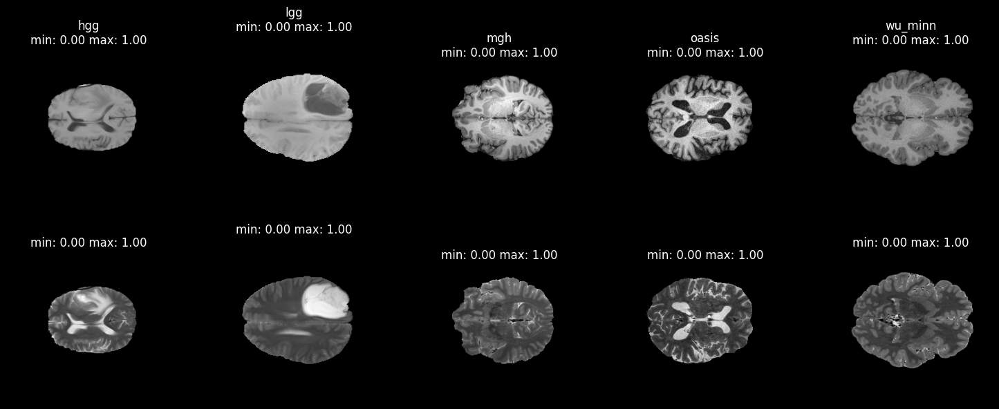

In [228]:
visualization.plot_pred([images, targets], datasets_labels, pad=1)

In [229]:
ssim_ylim = (0.6, 1.0)

## FedAvg

In [230]:
model_dir = "../trained_models/server/model-fedavg-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h"

In [231]:
histories_fedavg = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedavg-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedavg-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedavg-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedavg-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedavg-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_oasis_125/history.pkl...


In [232]:
histories_fedavg[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [233]:
loss_histories_fedavg = [history["loss"] for history in histories_fedavg]
ssim_histories_fedavg = [history["ssim"] for history in histories_fedavg]
pnsr_histories_fedavg = [history["pnsr"] for history in histories_fedavg]
mse_histories_fedavg = [history["mse"] for history in histories_fedavg]
zoomed_ssim_histories_fedavg = [history["zoomed_ssim"] for history in histories_fedavg]

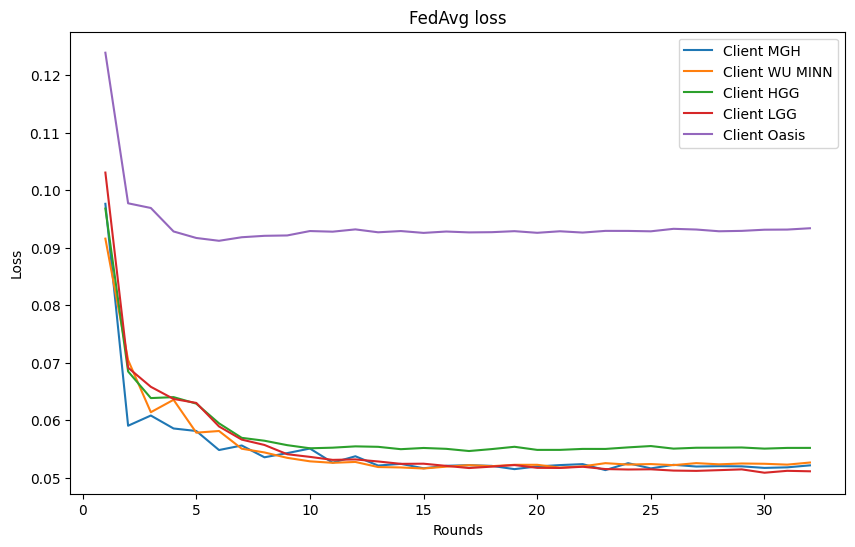

In [234]:
visualization.plot_learning_curves(loss_histories_fedavg, client_names, title="FedAvg loss")

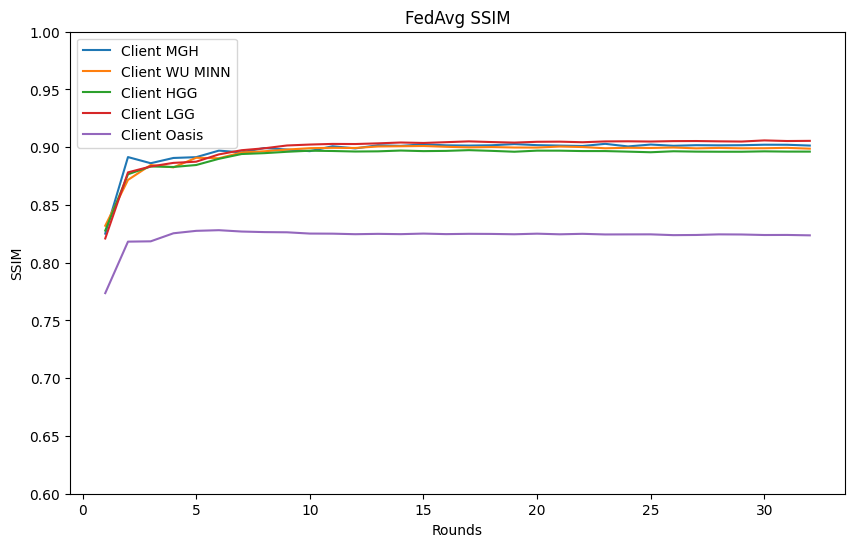

In [235]:
visualization.plot_learning_curves(ssim_histories_fedavg, client_names, title="FedAvg SSIM", ylabel="SSIM", ylim=ssim_ylim)

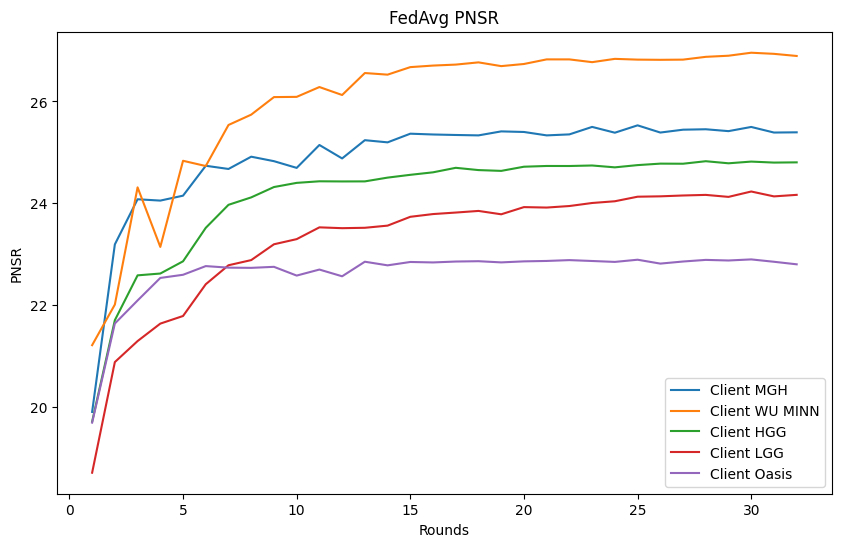

In [236]:
visualization.plot_learning_curves(pnsr_histories_fedavg, client_names, title="FedAvg PNSR", ylabel="PNSR")

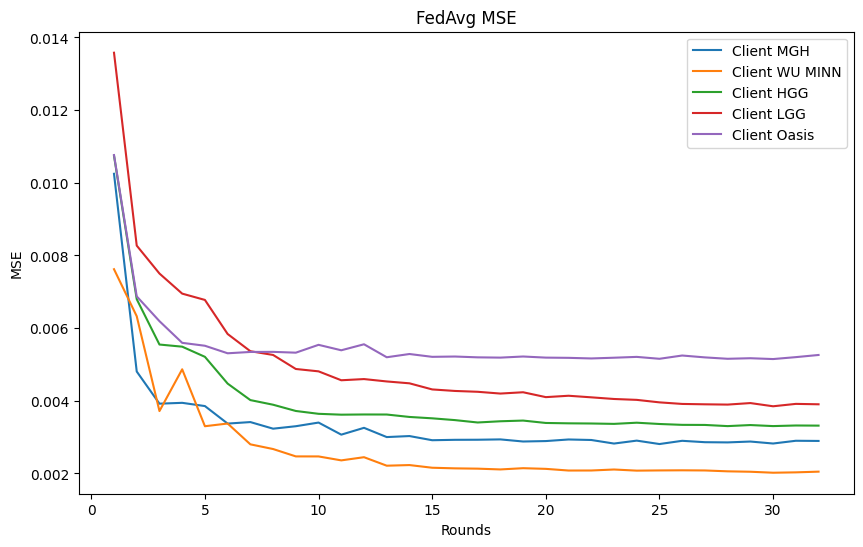

In [237]:
visualization.plot_learning_curves(mse_histories_fedavg, client_names, title="FedAvg MSE", ylabel="MSE")

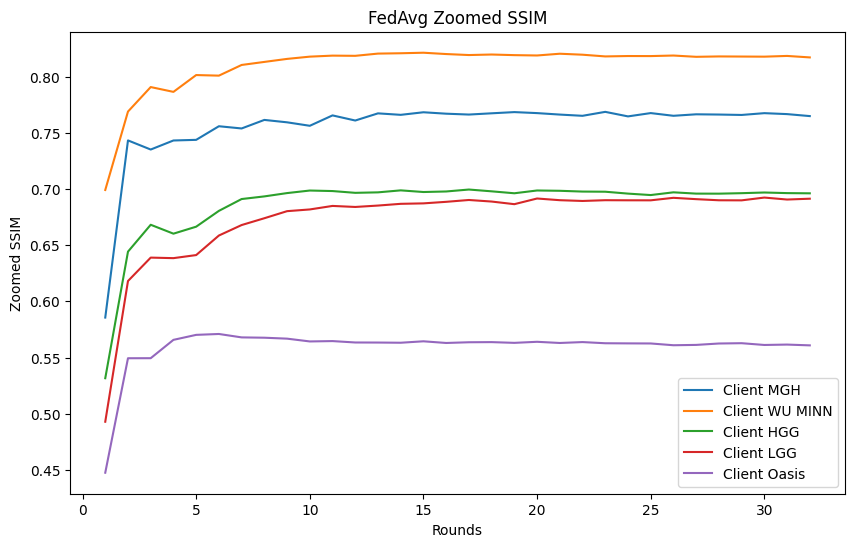

In [238]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedavg, client_names, title="FedAvg Zoomed SSIM", ylabel="Zoomed SSIM")

In [239]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [240]:
predictions_fedavg = pred_on_different_ds(unet)

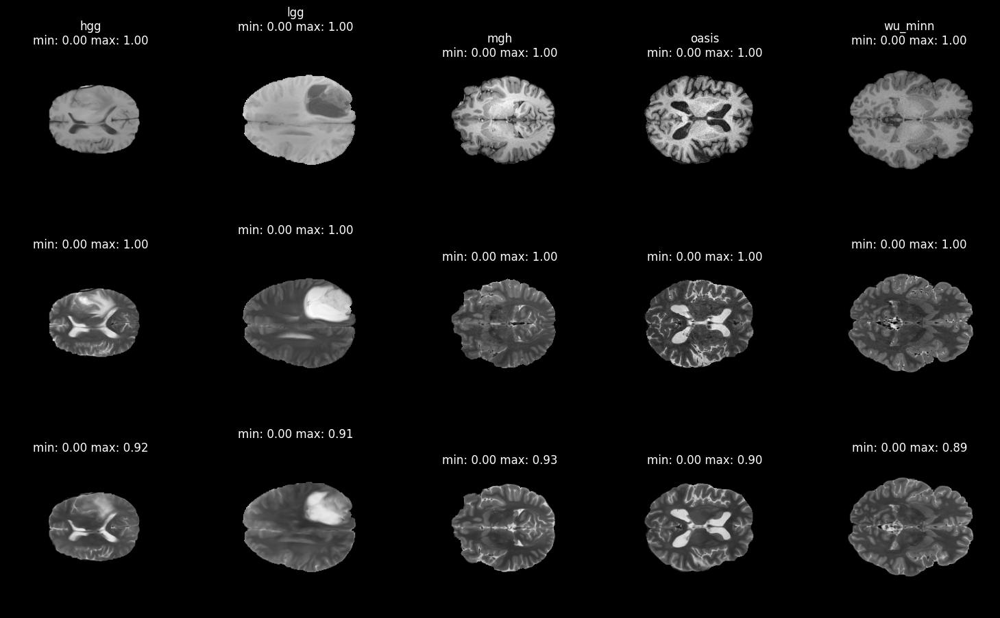

In [241]:
visualization.plot_pred([images, targets, predictions_fedavg], datasets_labels)

In [242]:
eval_metrics_fedavg = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedavg

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.052129,0.052740,0.055181,0.051443,0.093427
ssim,0.901523,0.898633,0.896239,0.904942,0.823677
zoomed_ssim,0.765092,0.816862,0.696062,0.690973,0.560601
pnsr,25.408472,26.888023,24.837081,24.190847,22.807357
mse,0.002892,0.002056,0.003301,0.003914,0.005266


## FedProx

In [243]:
model_dir = "../trained_models/server/model-fedprox-PROX-lr0.001-rd32-ep4-BN-2023-09-19-11h"

In [244]:
histories_fedprox = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedprox-PROX-lr0.001-rd32-ep4-BN-2023-09-19-11h\FedProx_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedprox-PROX-lr0.001-rd32-ep4-BN-2023-09-19-11h\FedProx_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedprox-PROX-lr0.001-rd32-ep4-BN-2023-09-19-11h\FedProx_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedprox-PROX-lr0.001-rd32-ep4-BN-2023-09-19-11h\FedProx_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedprox-PROX-lr0.001-rd32-ep4-BN-2023-09-19-11h\FedProx_client_oasis_125/history.pkl...


In [245]:
histories_fedprox[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [246]:
loss_histories_fedprox = [history["loss"] for history in histories_fedprox]
ssim_histories_fedprox = [history["ssim"] for history in histories_fedprox]
pnsr_histories_fedprox = [history["pnsr"] for history in histories_fedprox]
mse_histories_fedprox = [history["mse"] for history in histories_fedprox]
zoomed_ssim_histories_fedprox = [history["zoomed_ssim"] for history in histories_fedprox]

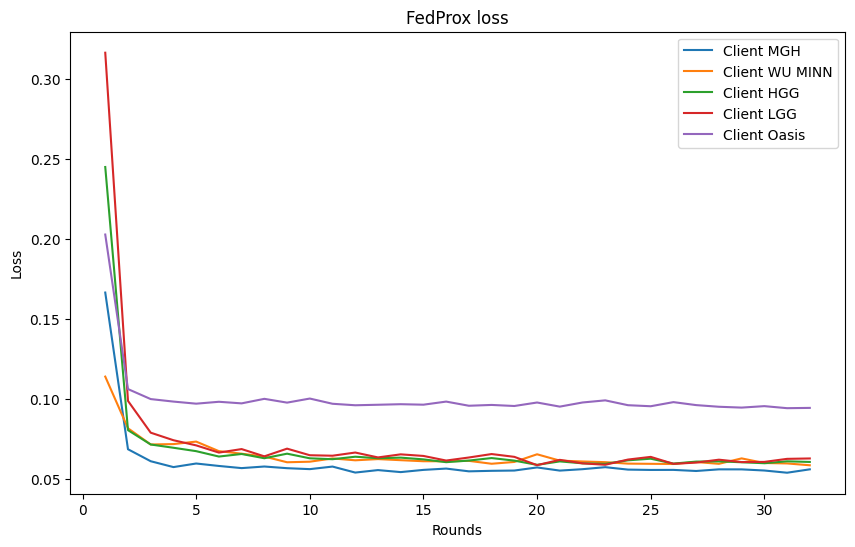

In [247]:
visualization.plot_learning_curves(loss_histories_fedprox, client_names, title="FedProx loss")

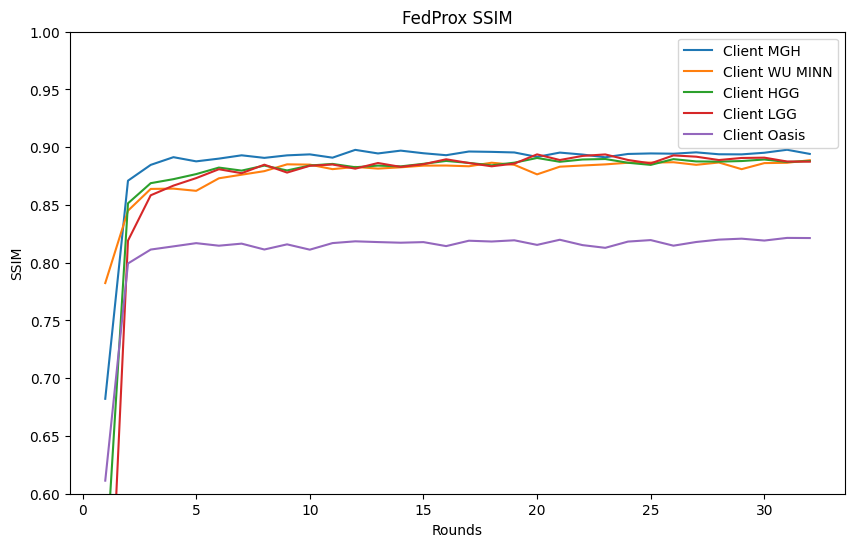

In [248]:
visualization.plot_learning_curves(ssim_histories_fedprox, client_names, title="FedProx SSIM", ylabel="SSIM" ,ylim=ssim_ylim)

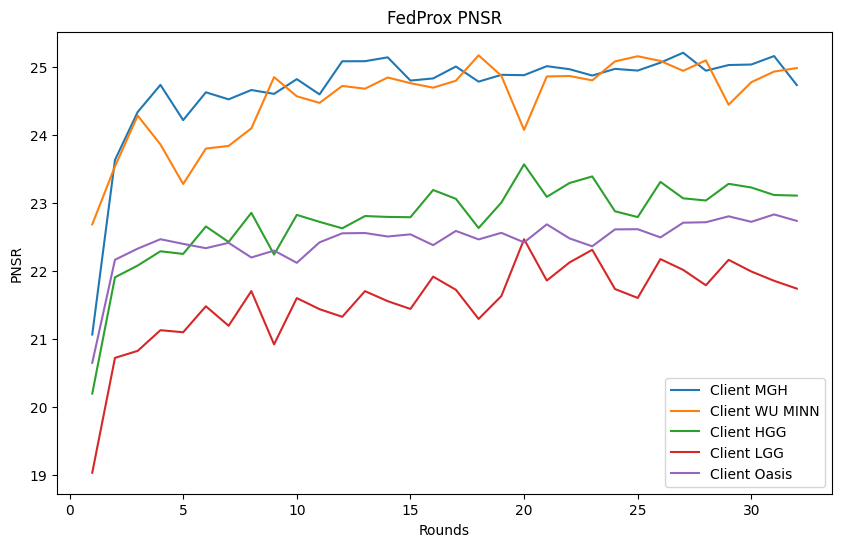

In [249]:
visualization.plot_learning_curves(pnsr_histories_fedprox, client_names, title="FedProx PNSR", ylabel="PNSR")

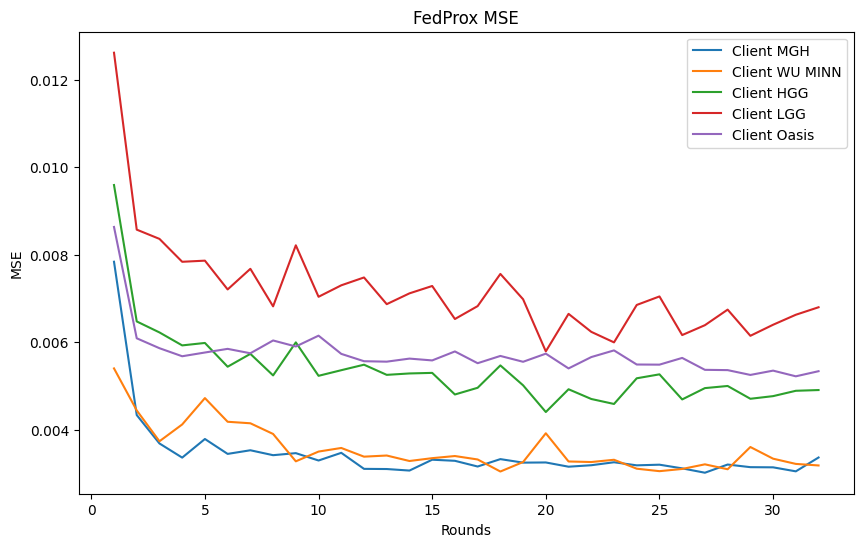

In [250]:
visualization.plot_learning_curves(mse_histories_fedprox, client_names, title="FedProx MSE", ylabel="MSE")

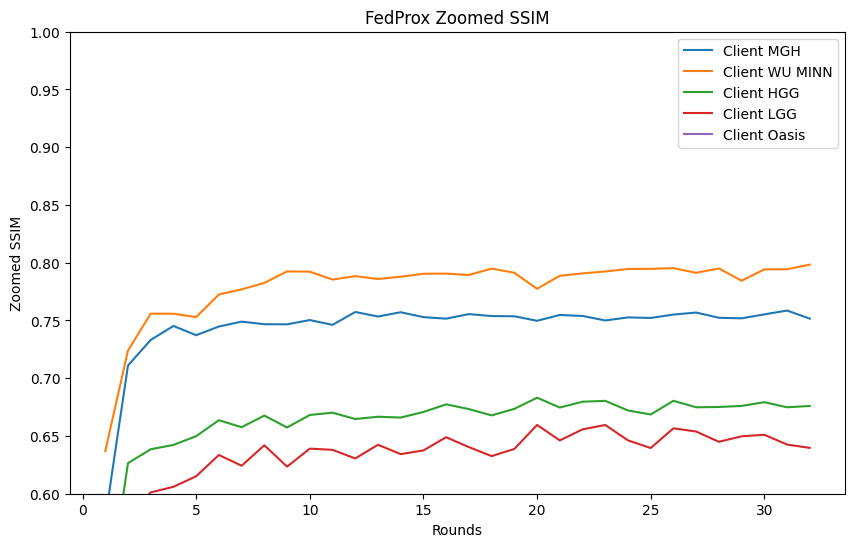

In [251]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedprox, client_names, title="FedProx Zoomed SSIM", ylabel="Zoomed SSIM", ylim=ssim_ylim)

In [252]:
unet = models.UNet(criterion=loss_functions.DssimMse(), normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [253]:
predictions_fedprox = pred_on_different_ds(unet)

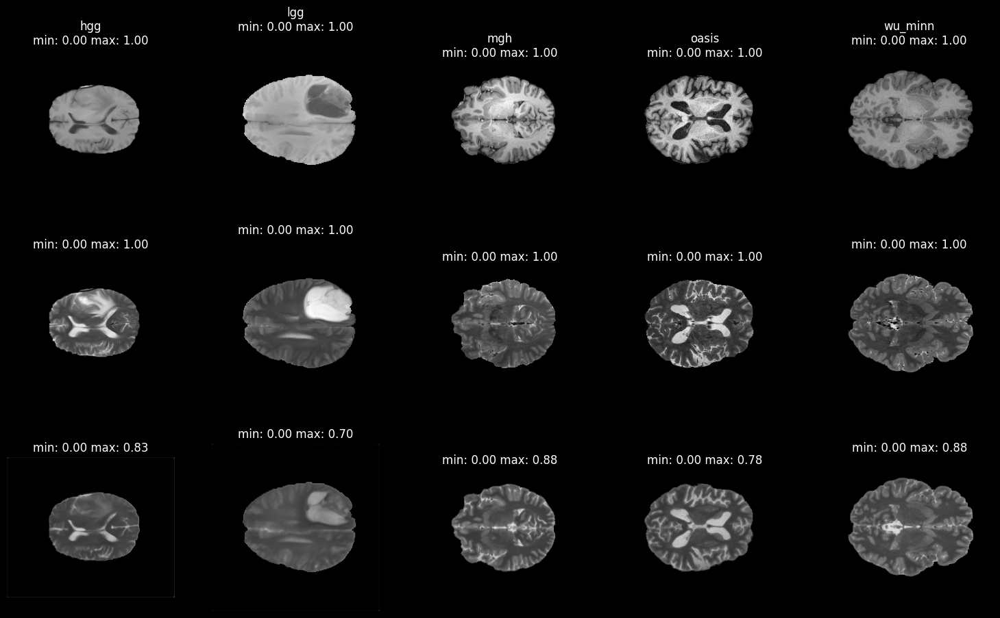

In [254]:
visualization.plot_pred([images, targets, predictions_fedprox], datasets_labels)

In [255]:
eval_metrics_fedprox = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedprox

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.056275,0.058748,0.060846,0.063163,0.094660
ssim,0.894177,0.888808,0.888099,0.887370,0.821411
zoomed_ssim,0.751634,0.798448,0.676431,0.639368,0.556250
pnsr,24.746412,25.050402,23.149081,21.758379,22.717611
mse,0.003365,0.003152,0.004895,0.006848,0.005365


## FedAdagrad BN

In [256]:
model_dir = "../trained_models/server/model-fedadagrad-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-15h"

In [257]:
histories_fedadagrad = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedadagrad-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-15h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedadagrad-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-15h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedadagrad-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-15h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedadagrad-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-15h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedadagrad-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-15h\FedAvg_client_oasis_125/history.pkl...


In [258]:
histories_fedadagrad[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [259]:
loss_histories_fedadagrad = [history["loss"] for history in histories_fedadagrad]
ssim_histories_fedadagrad = [history["ssim"] for history in histories_fedadagrad]
pnsr_histories_fedadagrad = [history["pnsr"] for history in histories_fedadagrad]
mse_histories_fedadagrad = [history["mse"] for history in histories_fedadagrad]
zoomed_ssim_histories_fedadagrad = [history["zoomed_ssim"] for history in histories_fedadagrad]

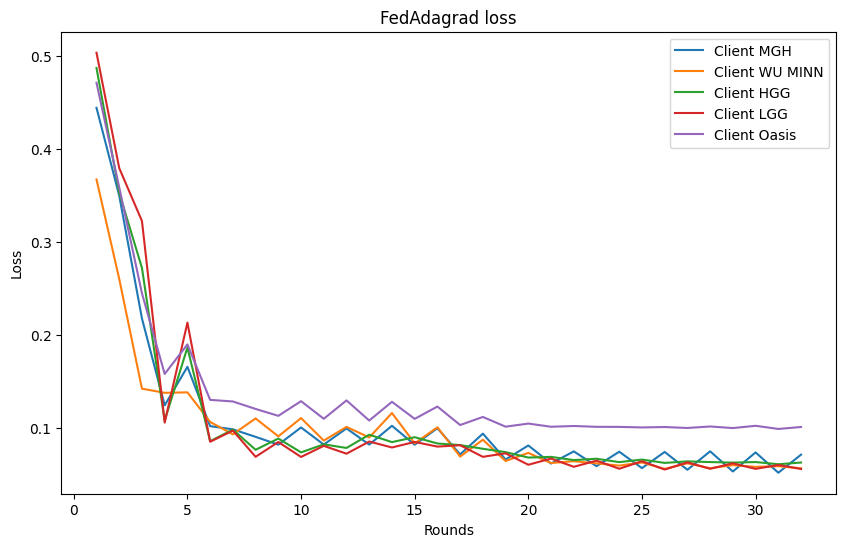

In [260]:
visualization.plot_learning_curves(loss_histories_fedadagrad, client_names, title="FedAdagrad loss")

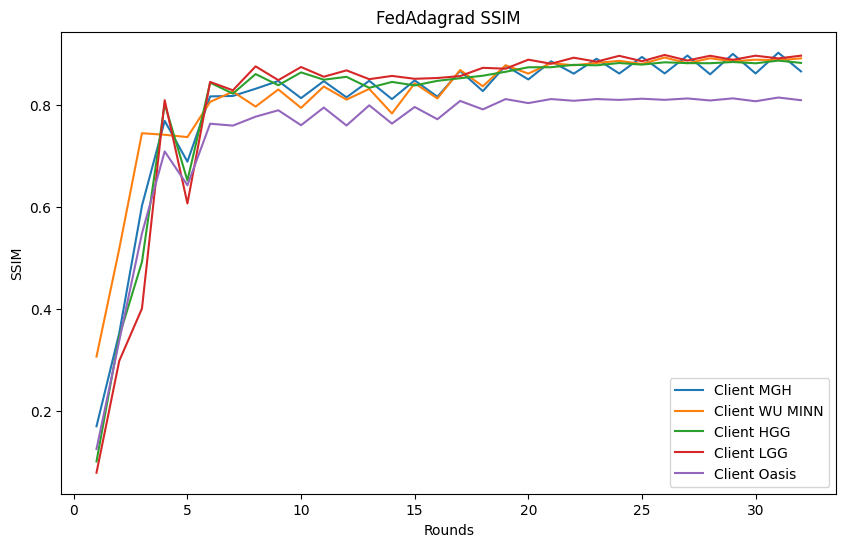

In [261]:
visualization.plot_learning_curves(ssim_histories_fedadagrad, client_names, title="FedAdagrad SSIM", ylabel="SSIM")

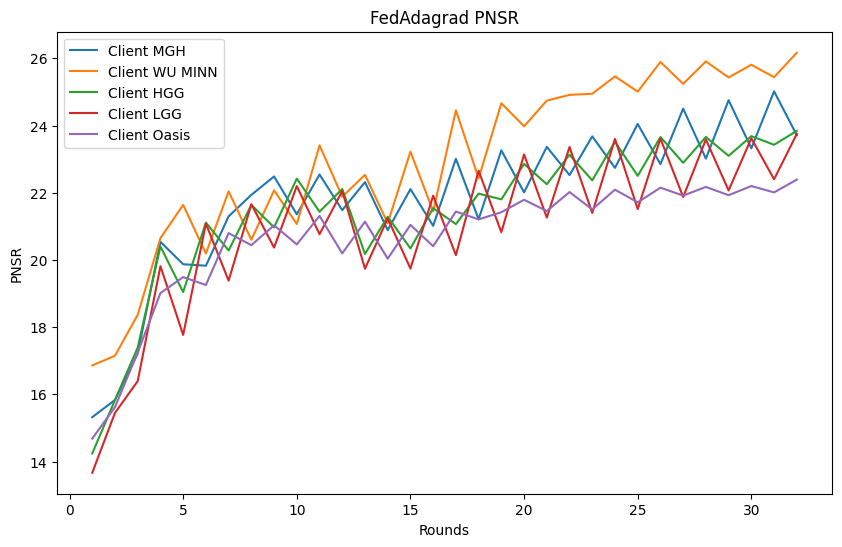

In [262]:
visualization.plot_learning_curves(pnsr_histories_fedadagrad, client_names, title="FedAdagrad PNSR", ylabel="PNSR")

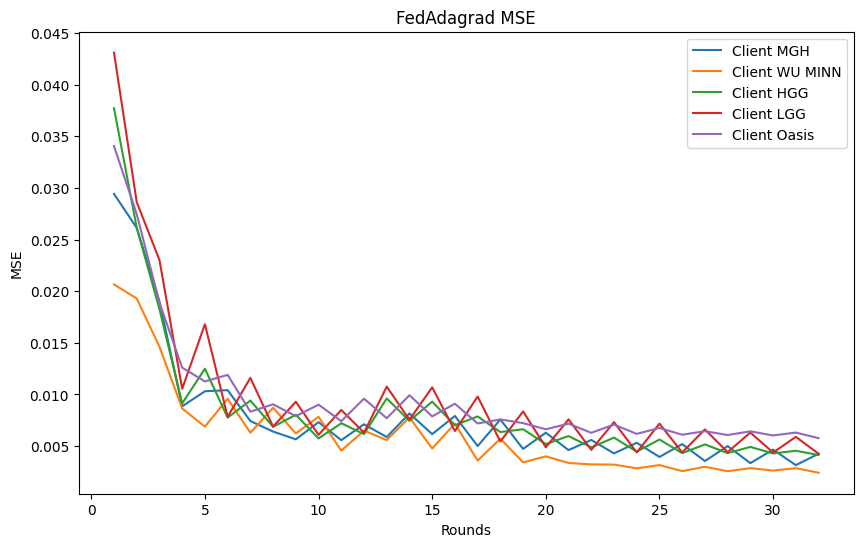

In [263]:
visualization.plot_learning_curves(mse_histories_fedadagrad, client_names, title="FedAdagrad MSE", ylabel="MSE")

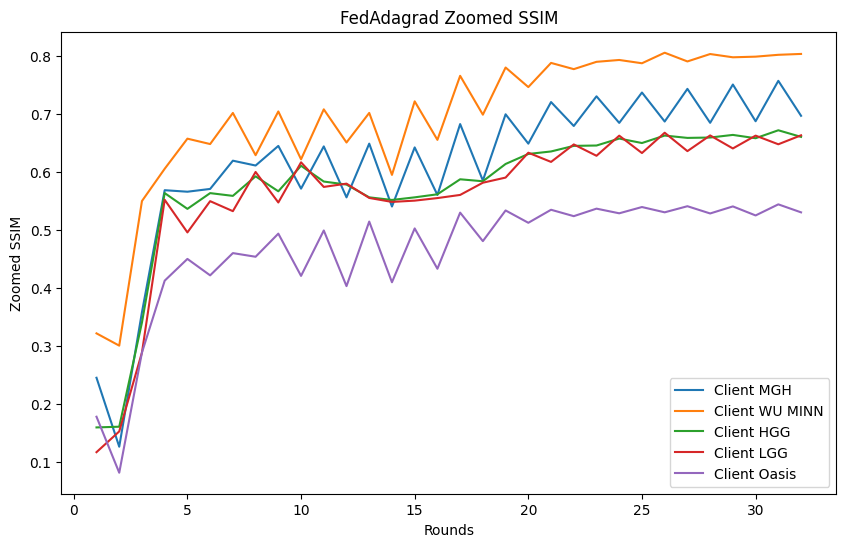

In [264]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedadagrad, client_names, title="FedAdagrad Zoomed SSIM", ylabel="Zoomed SSIM")

In [265]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [266]:
predictions_fedadagrad = pred_on_different_ds(unet)

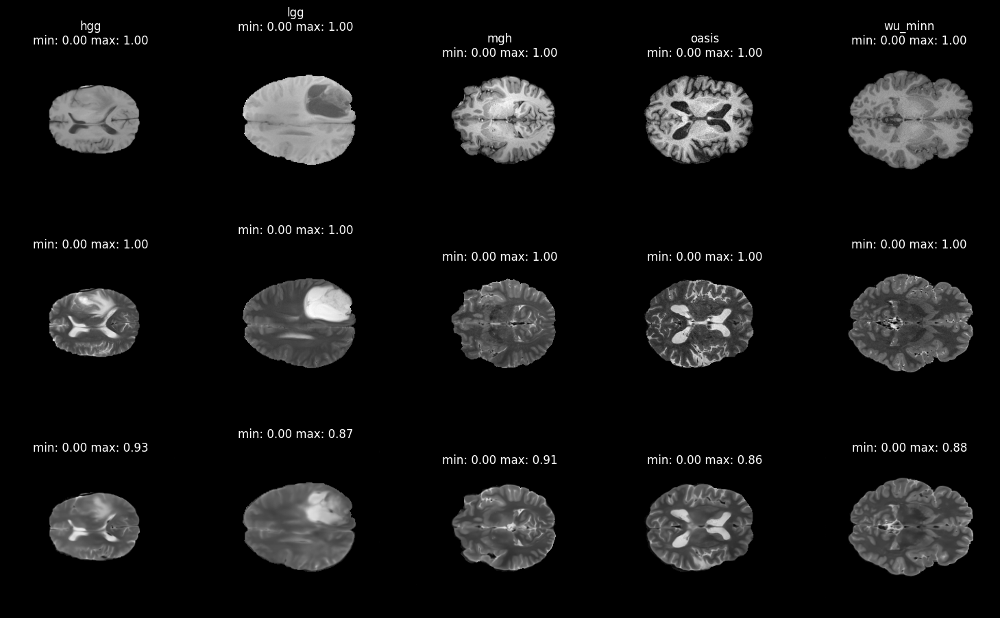

In [267]:
visualization.plot_pred([images, targets,  predictions_fedadagrad], datasets_labels)

In [268]:
eval_metrics_fedadagrad = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedadagrad

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.071674,0.057084,0.063205,0.056261,0.101454
ssim,0.865147,0.890665,0.881839,0.895993,0.808640
zoomed_ssim,0.696838,0.803267,0.660520,0.663089,0.530532
pnsr,23.726156,26.180367,23.866193,23.800319,22.396694
mse,0.004249,0.002416,0.004124,0.004258,0.005774


## FedYogi

In [269]:
model_dir = "../trained_models/server/model-fedyogi-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-16h"

In [270]:
histories_fedyogi = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedyogi-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-16h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedyogi-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-16h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedyogi-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-16h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedyogi-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-16h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedyogi-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-16h\FedAvg_client_oasis_125/history.pkl...


In [271]:
histories_fedyogi[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [272]:
loss_histories_fedyogi = [history["loss"] for history in histories_fedyogi]
ssim_histories_fedyogi = [history["ssim"] for history in histories_fedyogi]
pnsr_histories_fedyogi = [history["pnsr"] for history in histories_fedyogi]
mse_histories_fedyogi = [history["mse"] for history in histories_fedyogi]
zoomed_ssim_histories_fedyogi = [history["zoomed_ssim"] for history in histories_fedyogi]

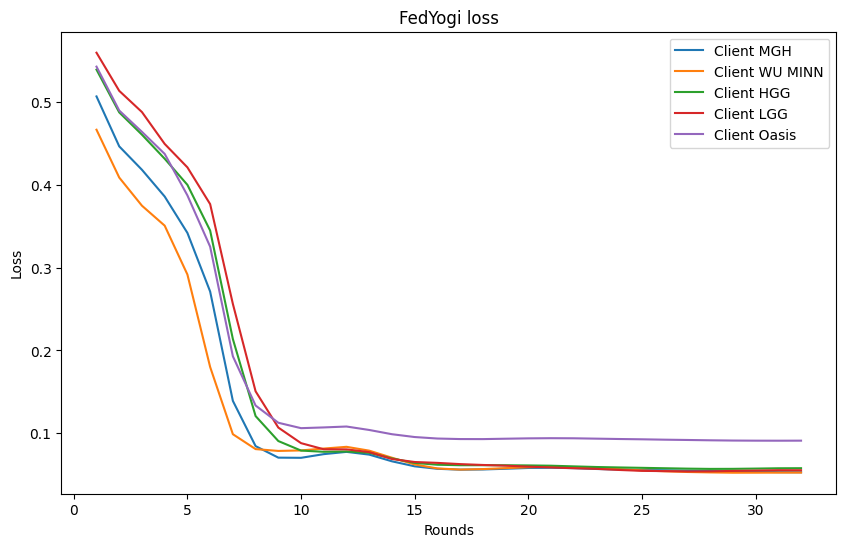

In [273]:
visualization.plot_learning_curves(loss_histories_fedyogi, client_names, title="FedYogi loss")

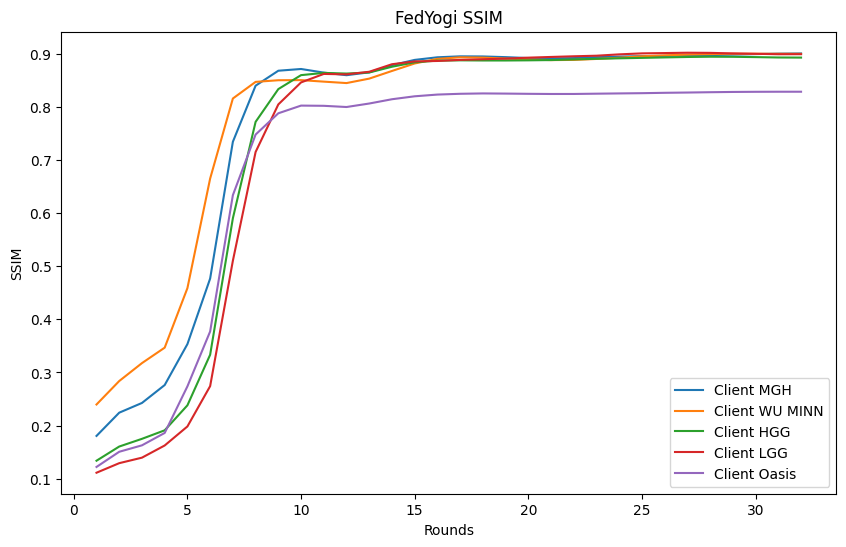

In [274]:
visualization.plot_learning_curves(ssim_histories_fedyogi, client_names, title="FedYogi SSIM", ylabel="SSIM")

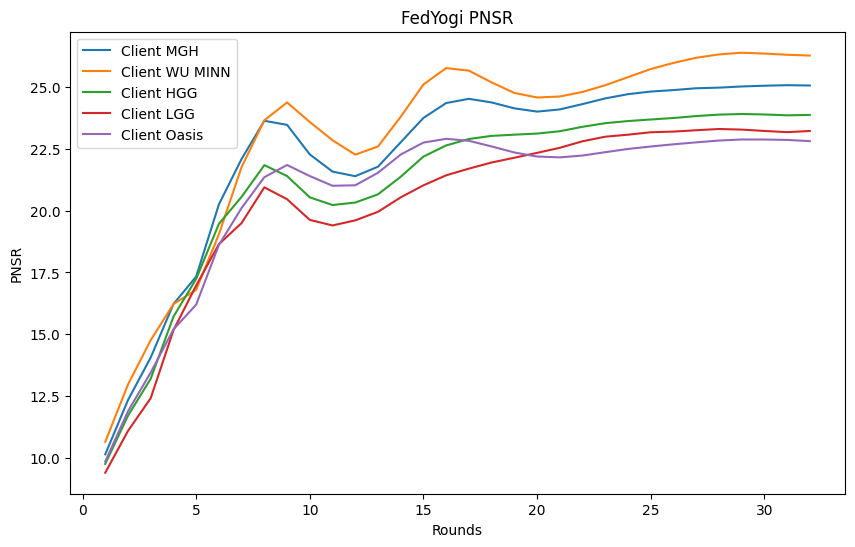

In [275]:
visualization.plot_learning_curves(pnsr_histories_fedyogi, client_names, title="FedYogi PNSR", ylabel="PNSR")

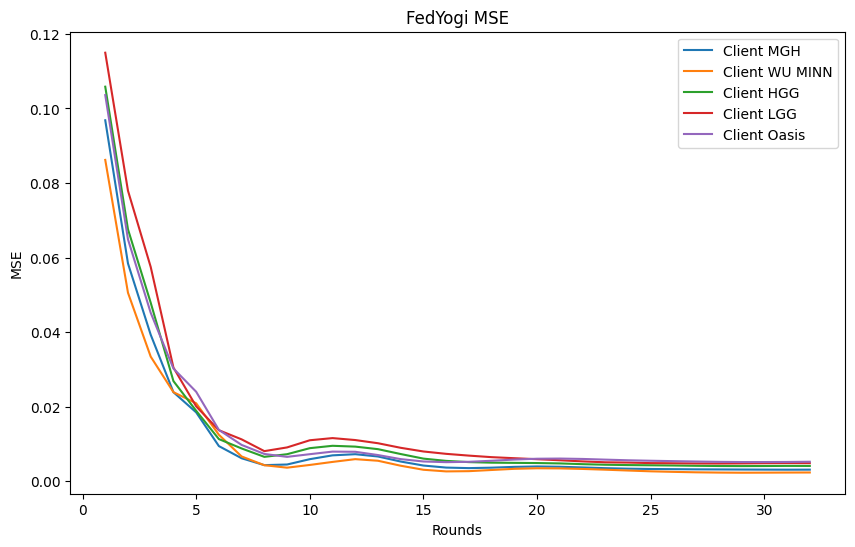

In [276]:
visualization.plot_learning_curves(mse_histories_fedyogi, client_names, title="FedYogi MSE", ylabel="MSE")

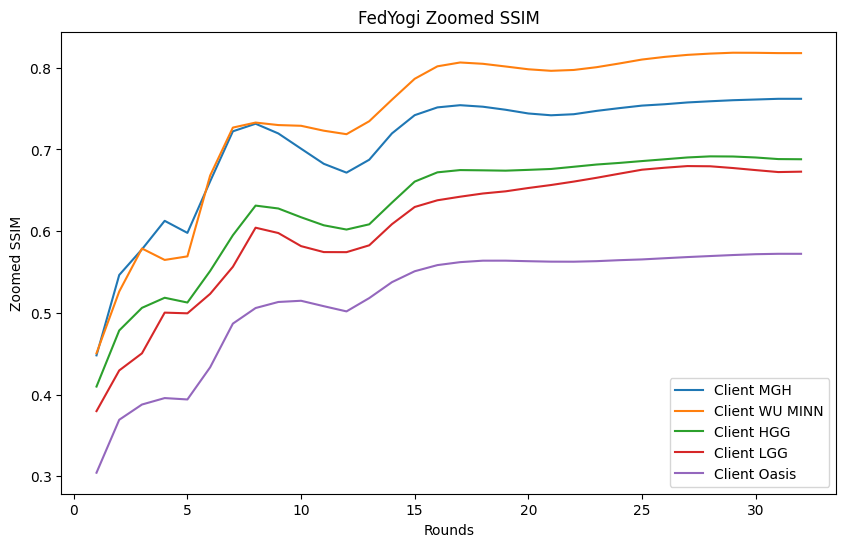

In [277]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedyogi, client_names, title="FedYogi Zoomed SSIM", ylabel="Zoomed SSIM")

In [278]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [279]:
predictions_fedyogi = pred_on_different_ds(unet)

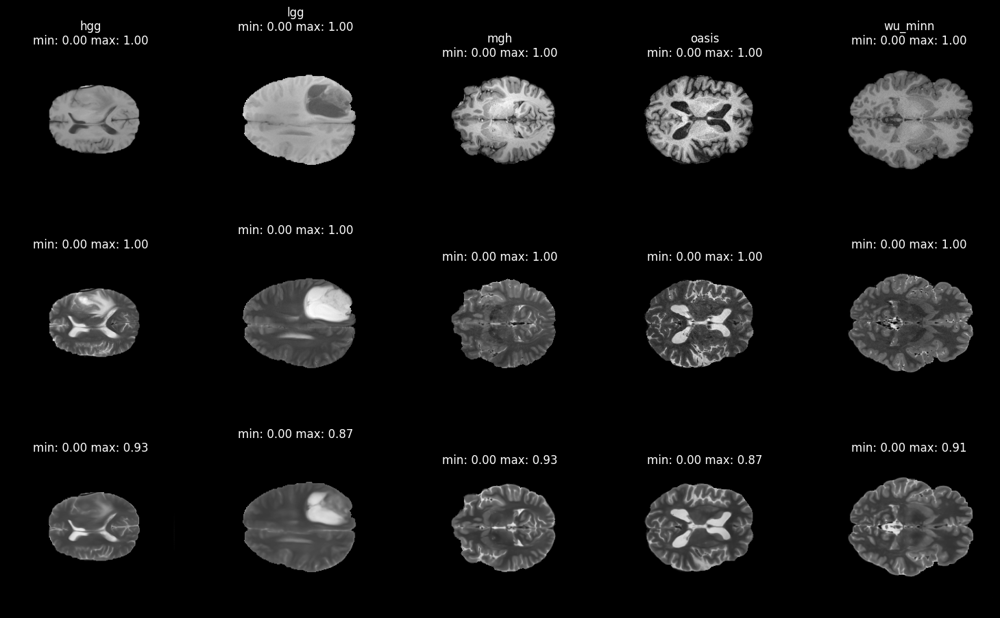

In [280]:
visualization.plot_pred([images, targets, predictions_fedyogi], datasets_labels)

In [281]:
eval_metrics_fedyogi = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedyogi

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.052993,0.052662,0.057841,0.057258,0.091370
ssim,0.900274,0.899424,0.892584,0.895349,0.827800
zoomed_ssim,0.761770,0.817712,0.687973,0.670025,0.571731
pnsr,25.058528,26.263291,23.875021,23.198908,22.803842
mse,0.003131,0.002374,0.004133,0.004932,0.005270


## FedAdam

In [282]:
model_dir = "../trained_models/server/model-fedadam-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h"

In [283]:
histories_fedadam = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedadam-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedadam-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedadam-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedadam-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedadam-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_oasis_125/history.pkl...


In [284]:
histories_fedadam[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [285]:
loss_histories_fedadam = [history["loss"] for history in histories_fedadam]
ssim_histories_fedadam = [history["ssim"] for history in histories_fedadam]
pnsr_histories_fedadam = [history["pnsr"] for history in histories_fedadam]
mse_histories_fedadam = [history["mse"] for history in histories_fedadam]
zoomed_ssim_histories_fedadam = [history["zoomed_ssim"] for history in histories_fedadam]

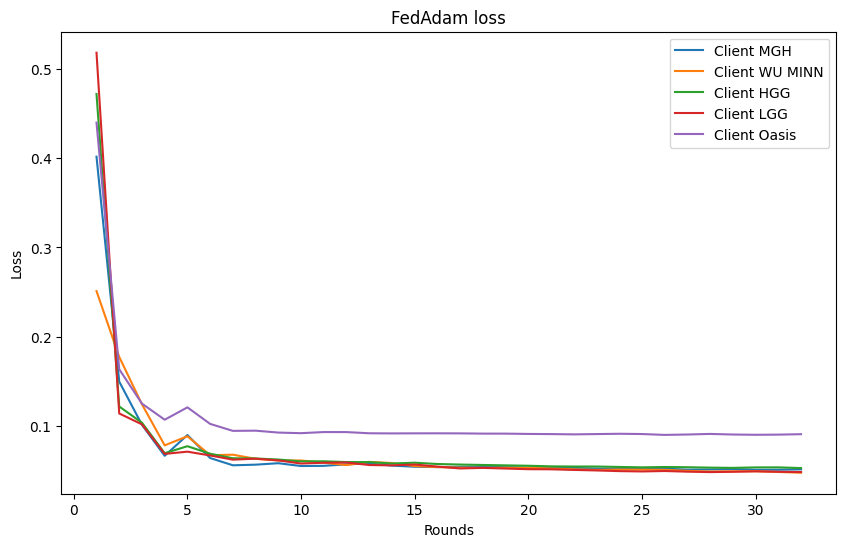

In [286]:
visualization.plot_learning_curves(loss_histories_fedadam, client_names, title="FedAdam loss")

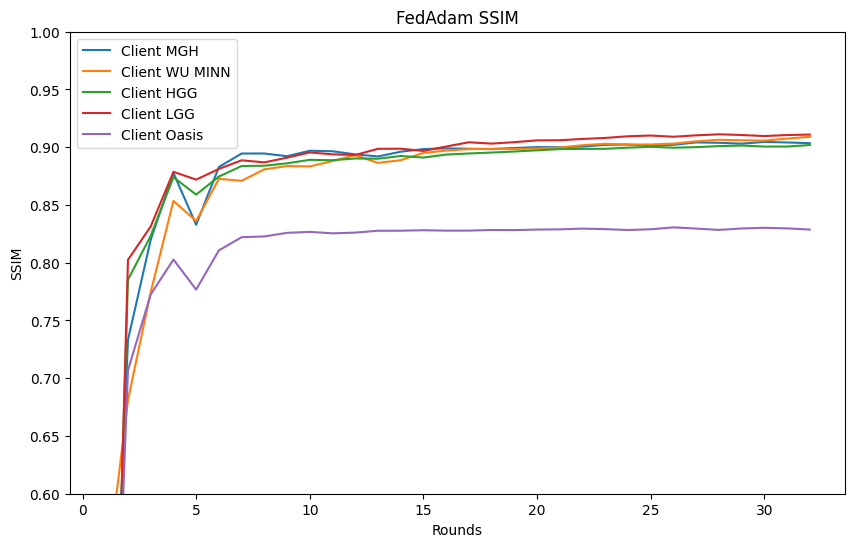

In [287]:
visualization.plot_learning_curves(ssim_histories_fedadam, client_names, title="FedAdam SSIM", ylabel="SSIM", ylim=ssim_ylim)

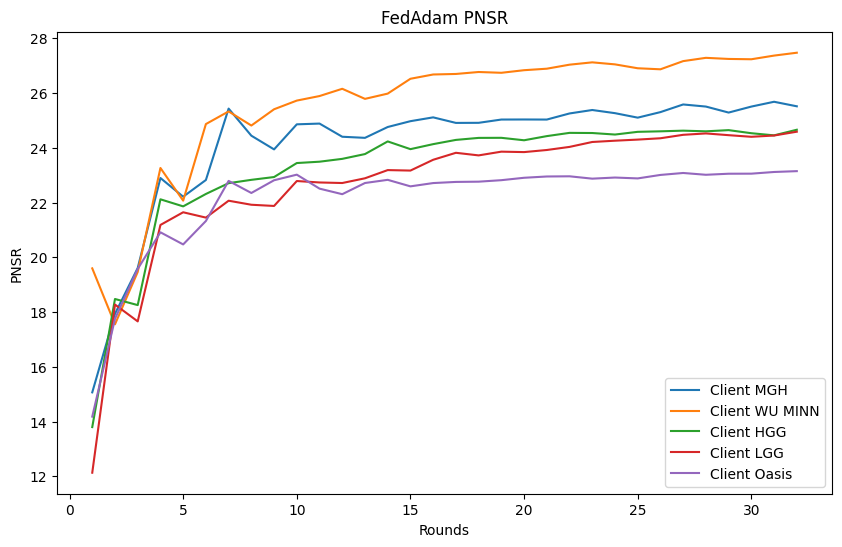

In [288]:
visualization.plot_learning_curves(pnsr_histories_fedadam, client_names, title="FedAdam PNSR", ylabel="PNSR")

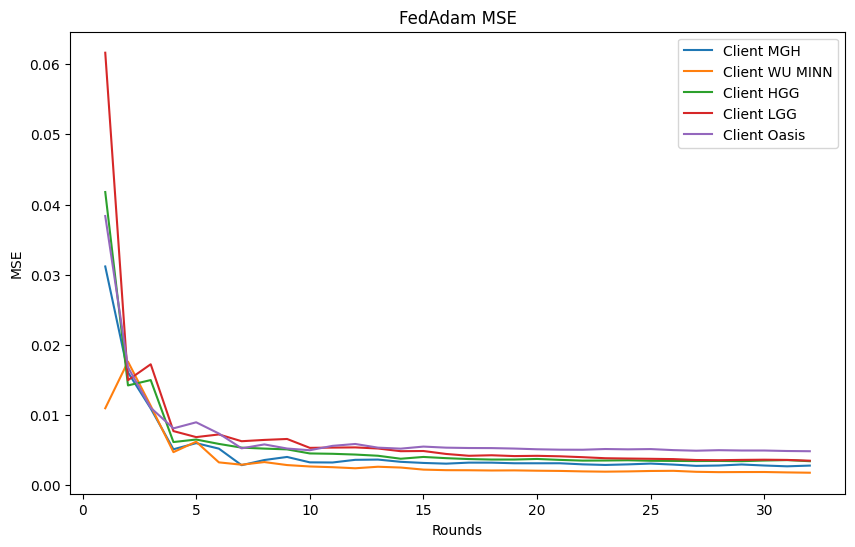

In [289]:
visualization.plot_learning_curves(mse_histories_fedadam, client_names, title="FedAdam MSE", ylabel="MSE")

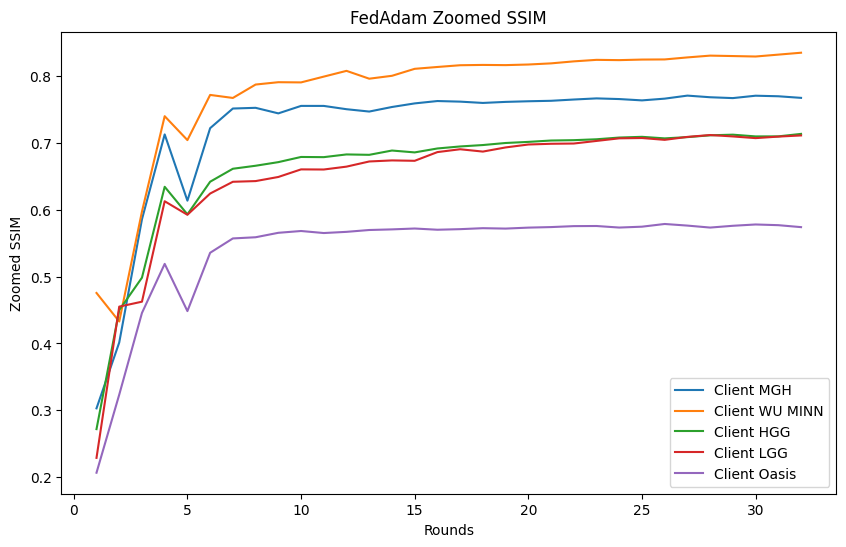

In [290]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedadam, client_names, title="FedAdam Zoomed SSIM", ylabel="Zoomed SSIM")

In [291]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [292]:
predictions_fedadam = pred_on_different_ds(unet)

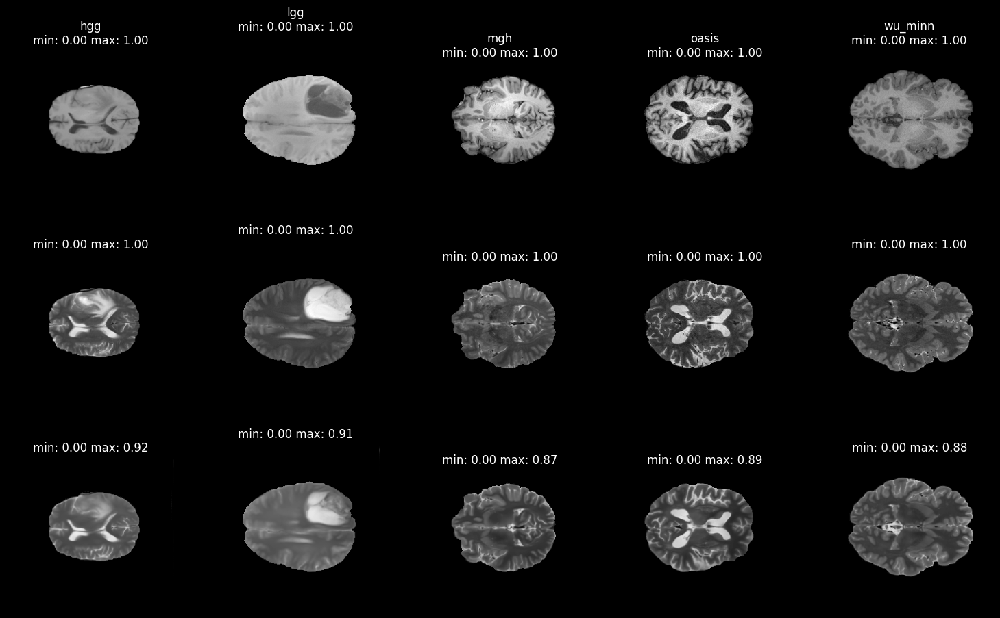

In [293]:
visualization.plot_pred([images, targets, predictions_fedadam], datasets_labels)

In [294]:
eval_metrics_fedadam = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedadam

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.051038,0.047338,0.052300,0.048646,0.090402
ssim,0.903542,0.908923,0.902234,0.909775,0.828887
zoomed_ssim,0.766984,0.834484,0.714011,0.710550,0.574154
pnsr,25.522569,27.470328,24.684650,24.602084,23.169803
mse,0.002809,0.001800,0.003417,0.003534,0.004846


## FedAvgM

In [295]:
model_dir = "../trained_models/server/model-fedavgm-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h"

In [296]:
histories_fedavgm = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedavgm-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedavgm-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedavgm-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedavgm-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedavgm-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_oasis_125/history.pkl...


In [297]:
histories_fedavgm[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [298]:
loss_histories_fedavgm = [history["loss"] for history in histories_fedavgm]
ssim_histories_fedavgm = [history["ssim"] for history in histories_fedavgm]
pnsr_histories_fedavgm = [history["pnsr"] for history in histories_fedavgm]
mse_histories_fedavgm = [history["mse"] for history in histories_fedavgm]
zoomed_ssim_histories_fedavgm = [history["zoomed_ssim"] for history in histories_fedavgm]

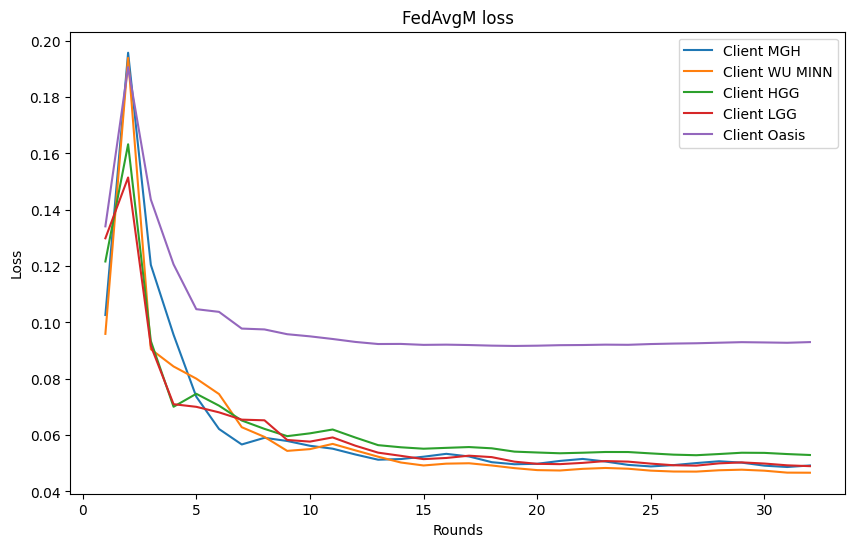

In [299]:
visualization.plot_learning_curves(loss_histories_fedavgm, client_names, title="FedAvgM loss")

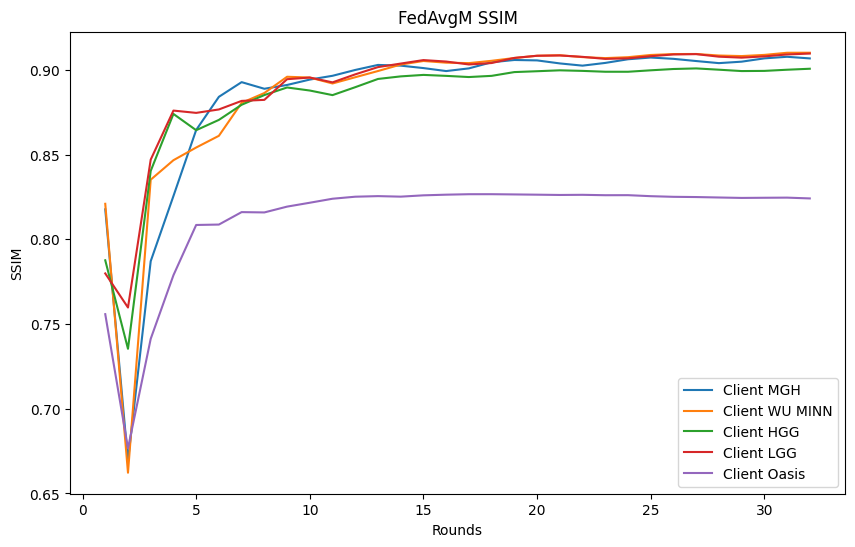

In [300]:
visualization.plot_learning_curves(ssim_histories_fedavgm, client_names, title="FedAvgM SSIM", ylabel="SSIM")

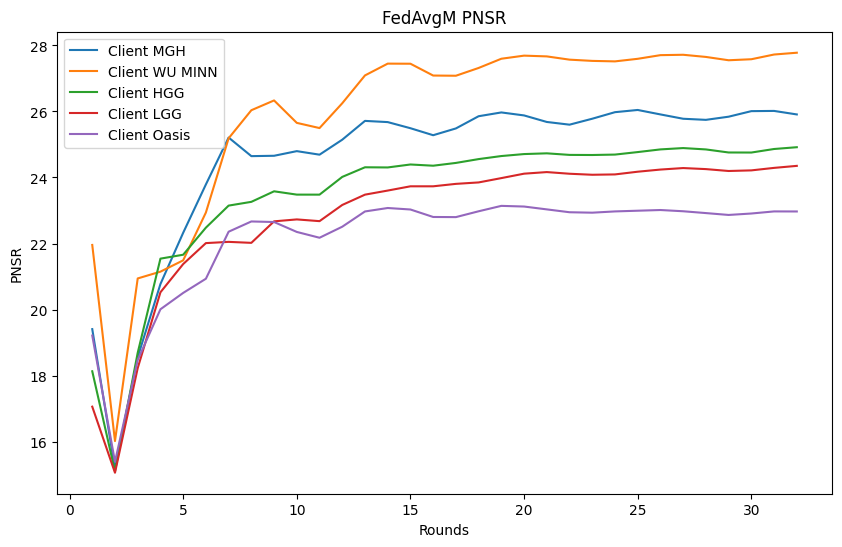

In [301]:
visualization.plot_learning_curves(pnsr_histories_fedavgm, client_names, title="FedAvgM PNSR", ylabel="PNSR")

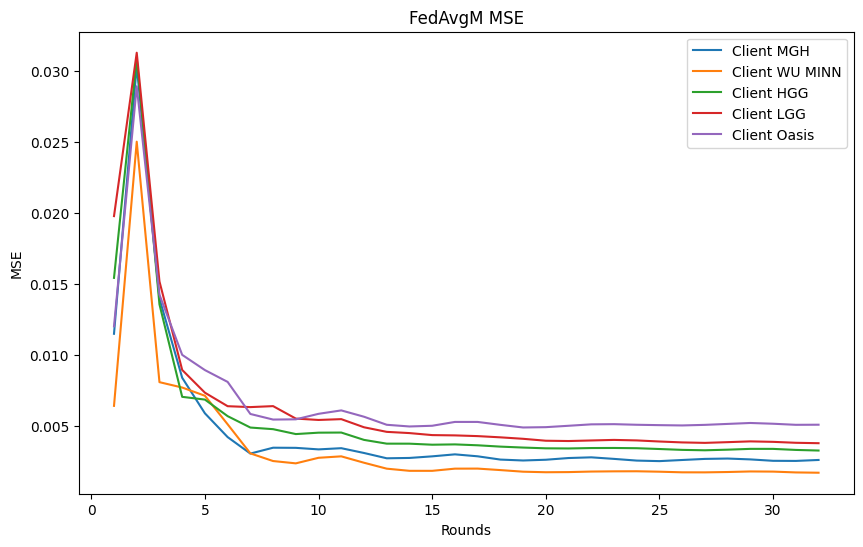

In [302]:
visualization.plot_learning_curves(mse_histories_fedavgm, client_names, title="FedAvgM MSE", ylabel="MSE")

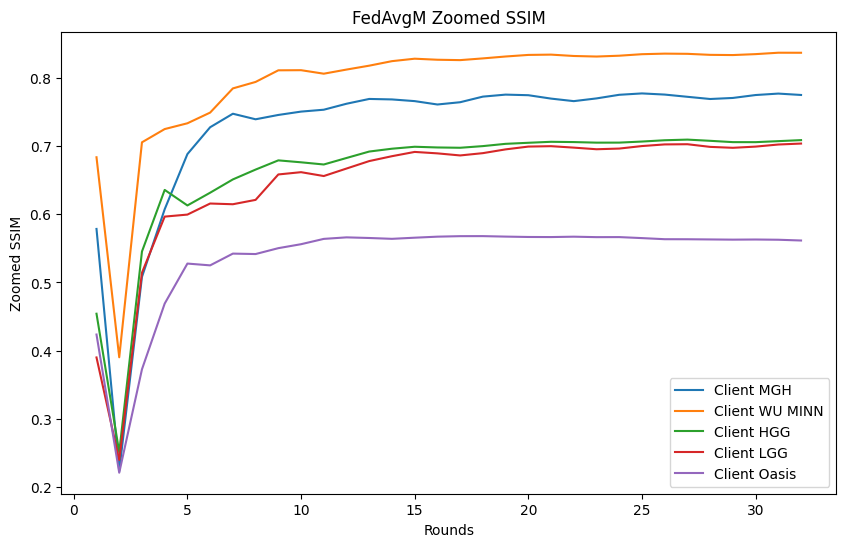

In [303]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedavgm, client_names, title="FedAvgM Zoomed SSIM", ylabel="Zoomed SSIM")

In [304]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round17.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [305]:
predictions_fedavgm = pred_on_different_ds(unet)

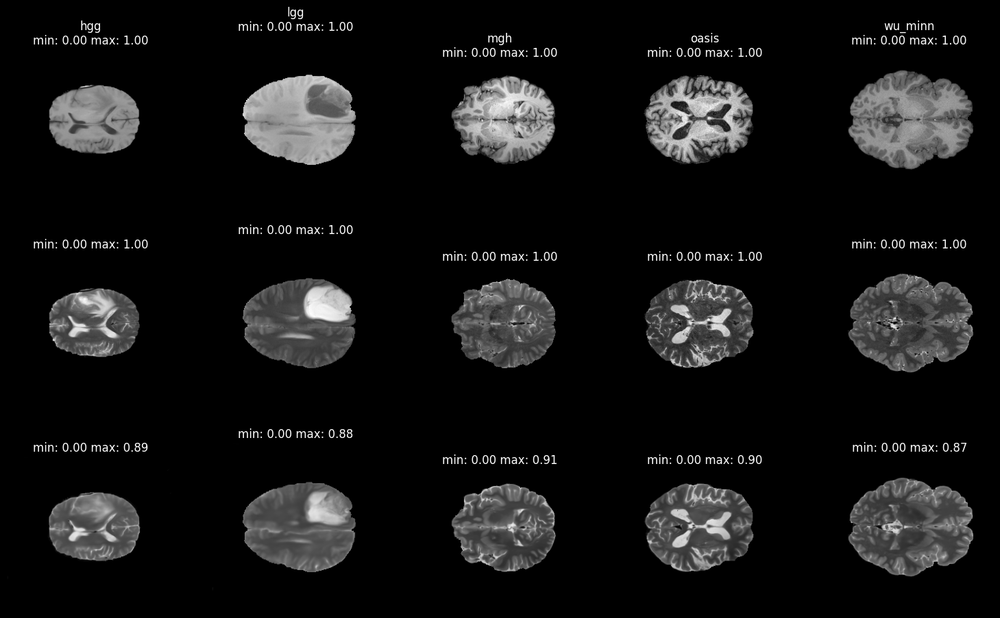

In [306]:
visualization.plot_pred([images, targets, predictions_fedavgm], datasets_labels)

In [307]:
eval_metrics_fedavgm = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedavgm

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.049176,0.046650,0.053107,0.049127,0.093083
ssim,0.906789,0.910046,0.900304,0.909325,0.823965
zoomed_ssim,0.774884,0.836519,0.707889,0.702680,0.561002
pnsr,25.912697,27.780901,24.910407,24.365806,22.973276
mse,0.002572,0.001673,0.003259,0.003789,0.005065


# FedBN

In [308]:
model_dir = "../trained_models/server/model-fedbn-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-17-23h"

In [309]:
histories_fedbn = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedbn-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-17-23h\FedBN(batch_norm=NormalizationType.BN)_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedbn-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-17-23h\FedBN(batch_norm=NormalizationType.BN)_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedbn-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-17-23h\FedBN(batch_norm=NormalizationType.BN)_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedbn-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-17-23h\FedBN(batch_norm=NormalizationType.BN)_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedbn-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-17-23h\FedBN(batch_norm=NormalizationType.BN)_client_oasis_125/history.pkl...


In [310]:
histories_fedbn[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [311]:
loss_histories_fedbn = [history["loss"] for history in histories_fedbn]
ssim_histories_fedbn = [history["ssim"] for history in histories_fedbn]
pnsr_histories_fedbn = [history["pnsr"] for history in histories_fedbn]
mse_histories_fedbn = [history["mse"] for history in histories_fedbn]
zoomed_ssim_histories_fedbn = [history["zoomed_ssim"] for history in histories_fedbn]

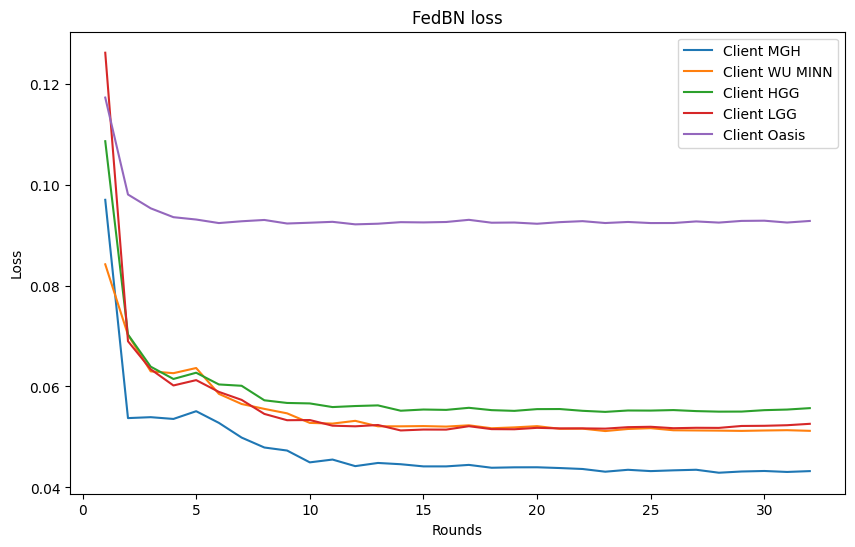

In [312]:
visualization.plot_learning_curves(loss_histories_fedbn, client_names, title="FedBN loss")

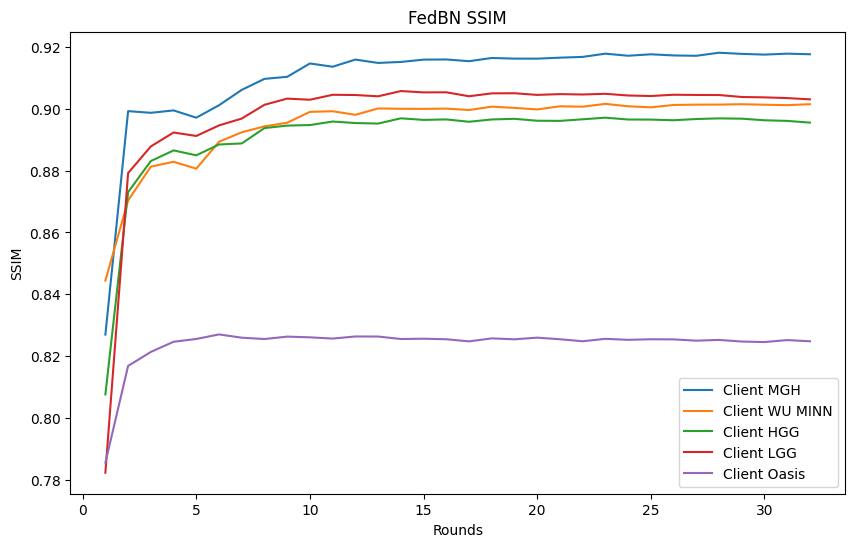

In [313]:
visualization.plot_learning_curves(ssim_histories_fedbn, client_names, title="FedBN SSIM", ylabel="SSIM")

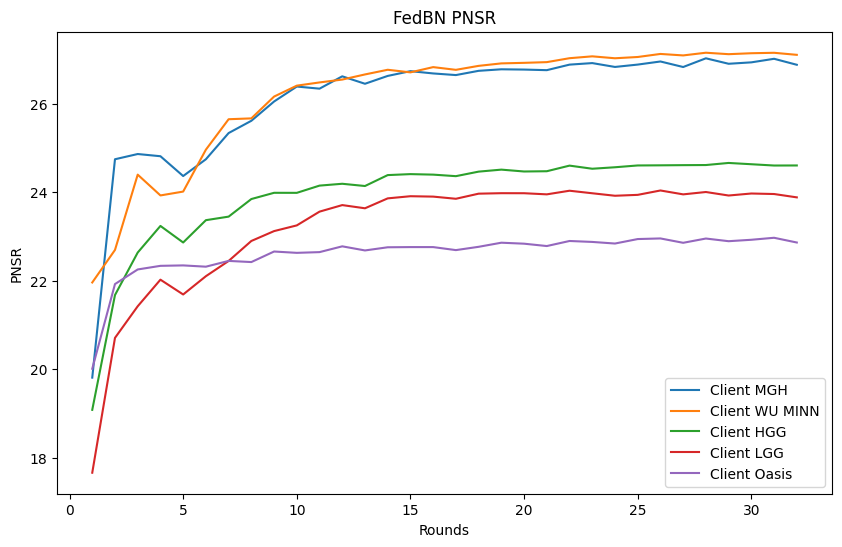

In [314]:
visualization.plot_learning_curves(pnsr_histories_fedbn, client_names, title="FedBN PNSR", ylabel="PNSR")

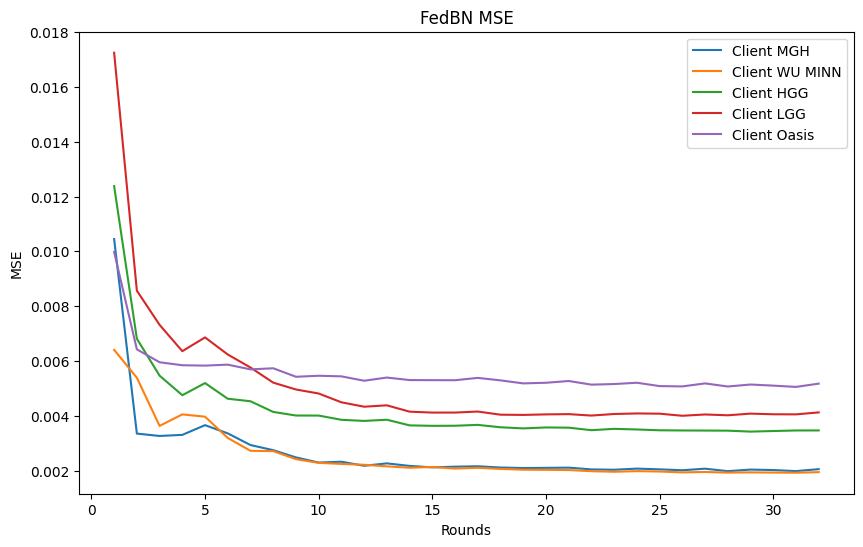

In [315]:
visualization.plot_learning_curves(mse_histories_fedbn, client_names, title="FedBN MSE", ylabel="MSE")

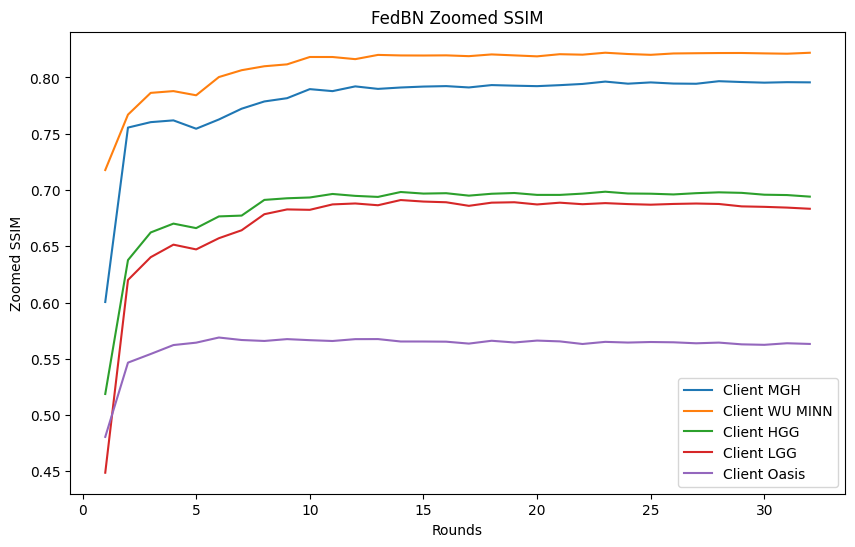

In [316]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedbn, client_names, title="FedBN Zoomed SSIM", ylabel="Zoomed SSIM")

In [317]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/FedBN(batch_norm=NormalizationType.BN)_client_hgg_50/model.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [318]:
predictions_fedbn = pred_on_different_ds(unet)

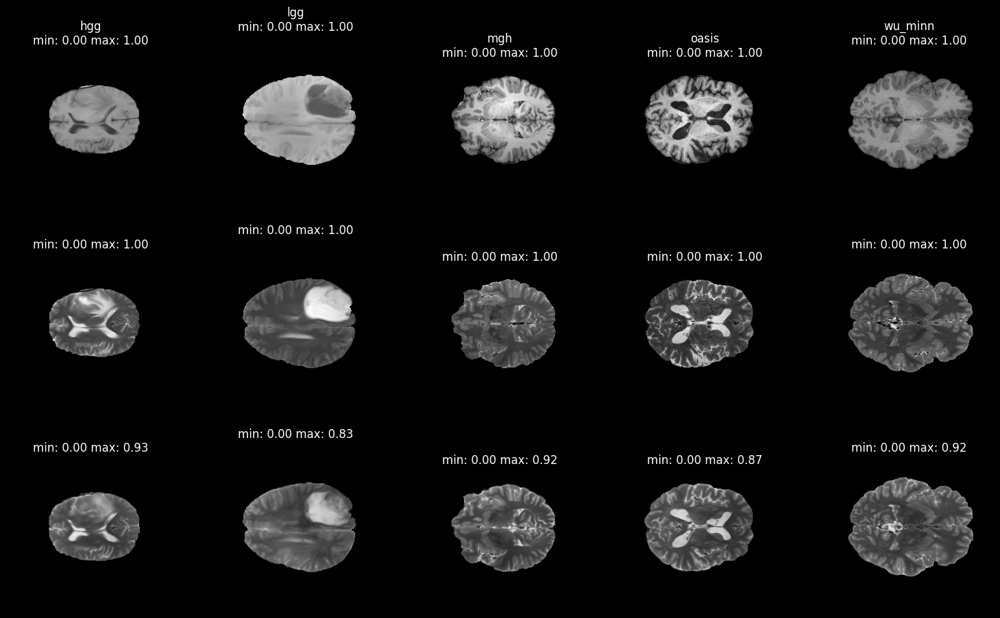

In [319]:
visualization.plot_pred([images, targets, predictions_fedbn], datasets_labels)

In [320]:
eval_metrics_fedbn = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedbn

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.043265,0.051166,0.055715,0.052686,0.092874
ssim,0.917590,0.901574,0.895530,0.902861,0.824632
zoomed_ssim,0.795632,0.822031,0.694030,0.683697,0.562717
pnsr,26.888047,27.111976,24.607446,23.934822,22.869399
mse,0.002061,0.001953,0.003479,0.004117,0.005190


## FedCostW

In [321]:
model_dir = "../trained_models/server/model-fedcostw-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h"

In [322]:
histories_fedcost = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedcostw-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedcostw-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedcostw-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedcostw-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedcostw-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-10h\FedAvg_client_oasis_125/history.pkl...


In [323]:
histories_fedcost[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [324]:
loss_histories_fedcost = [history["loss"] for history in histories_fedcost]
ssim_histories_fedcost = [history["ssim"] for history in histories_fedcost]
pnsr_histories_fedcost = [history["pnsr"] for history in histories_fedcost]
mse_histories_fedcost = [history["mse"] for history in histories_fedcost]
zoomed_ssim_histories_fedcost = [history["zoomed_ssim"] for history in histories_fedcost]

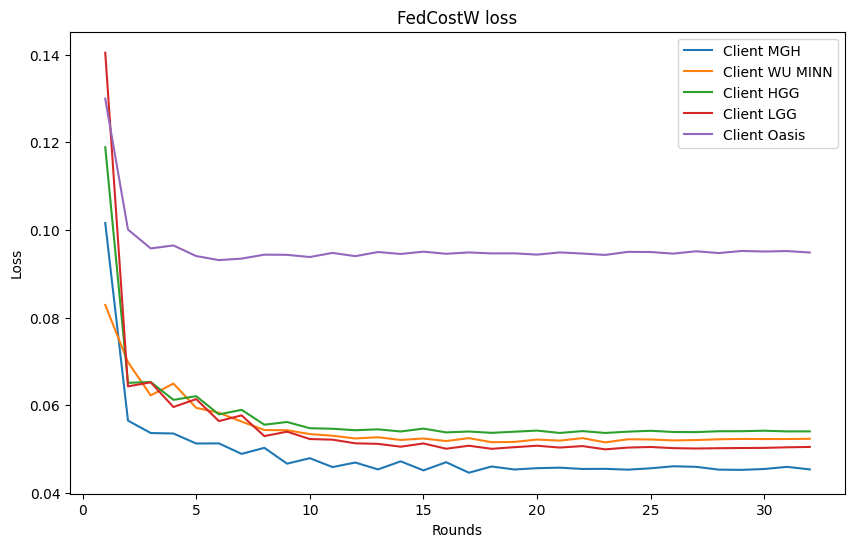

In [325]:
visualization.plot_learning_curves(loss_histories_fedcost, client_names, title="FedCostW loss")

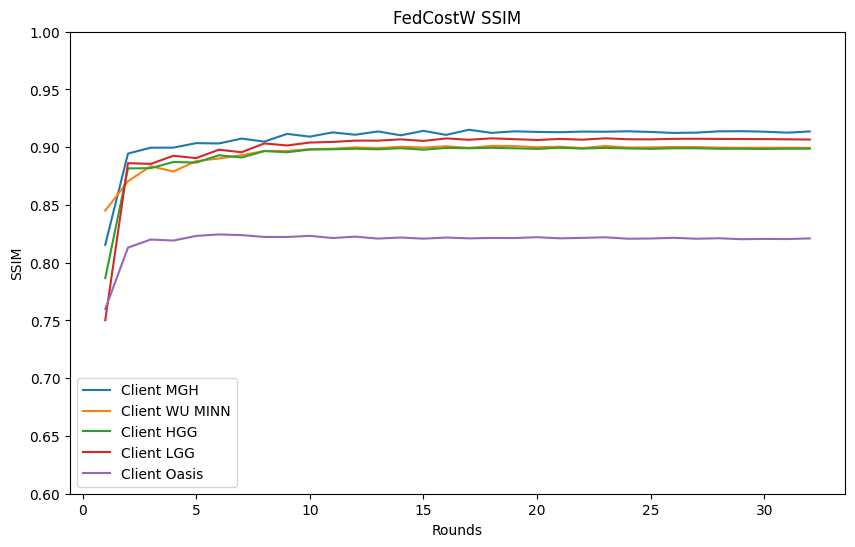

In [326]:
visualization.plot_learning_curves(ssim_histories_fedcost, client_names, title="FedCostW SSIM", ylabel="SSIM", ylim=ssim_ylim)

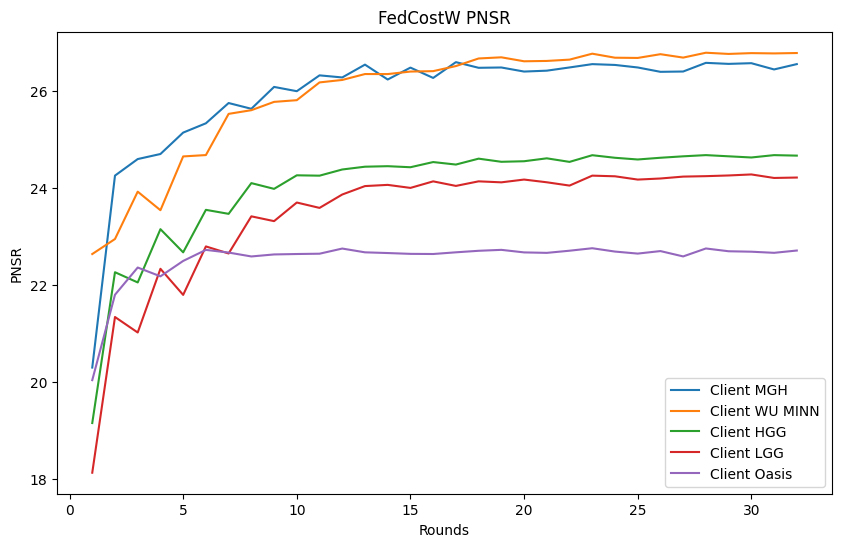

In [327]:
visualization.plot_learning_curves(pnsr_histories_fedcost, client_names, title="FedCostW PNSR", ylabel="PNSR")

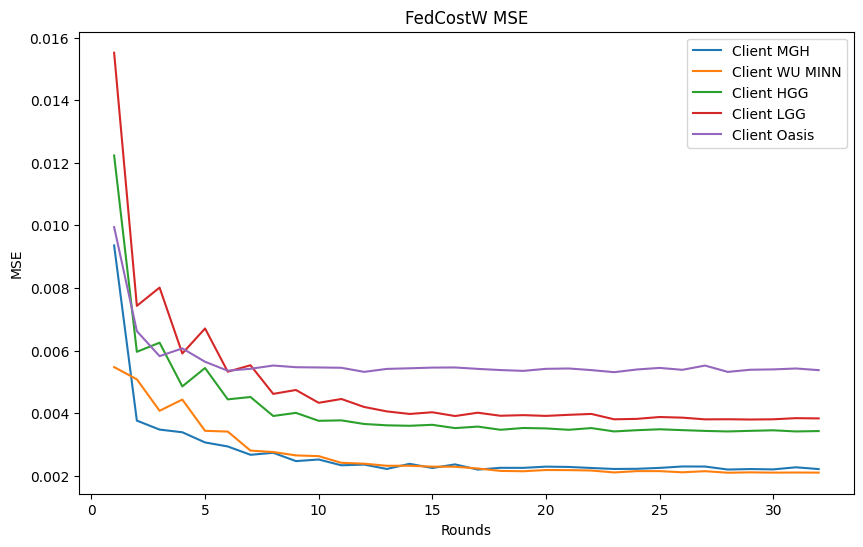

In [328]:
visualization.plot_learning_curves(mse_histories_fedcost, client_names, title="FedCostW MSE", ylabel="MSE")

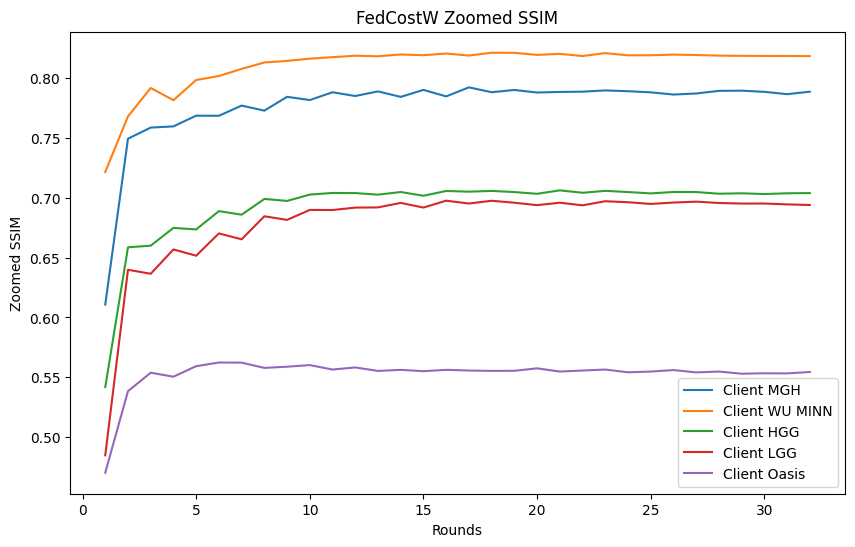

In [329]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedcost, client_names, title="FedCostW Zoomed SSIM", ylabel="Zoomed SSIM")

In [330]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [331]:
predictions_fedcostw = pred_on_different_ds(unet)

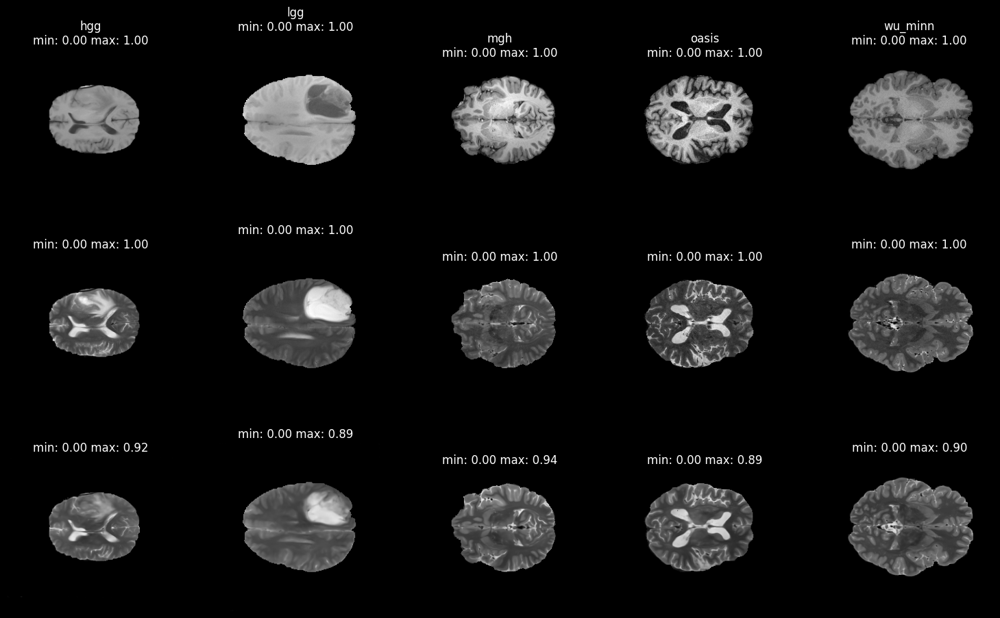

In [332]:
visualization.plot_pred([images, targets, predictions_fedcostw], datasets_labels)

In [333]:
eval_metrics_fedcostw = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedcostw

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.045389,0.052343,0.053964,0.050458,0.095042
ssim,0.913637,0.899514,0.898906,0.906727,0.820706
zoomed_ssim,0.788518,0.818218,0.704065,0.694121,0.553671
pnsr,26.570756,26.795432,24.692429,24.312519,22.698200
mse,0.002209,0.002100,0.003416,0.003821,0.005396


## FedPID

In [334]:
model_dir = "../trained_models/server/model-fedpid-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h"

In [335]:
histories_fedpid = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedpid-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedpid-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedpid-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedpid-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedpid-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_oasis_125/history.pkl...


In [336]:
histories_fedpid[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [337]:
loss_histories_fedpid = [history["loss"] for history in histories_fedpid]
ssim_histories_fedpid = [history["ssim"] for history in histories_fedpid]
pnsr_histories_fedpid = [history["pnsr"] for history in histories_fedpid]
mse_histories_fedpid = [history["mse"] for history in histories_fedpid]
zoomed_ssim_histories_fedpid = [history["zoomed_ssim"] for history in histories_fedpid]

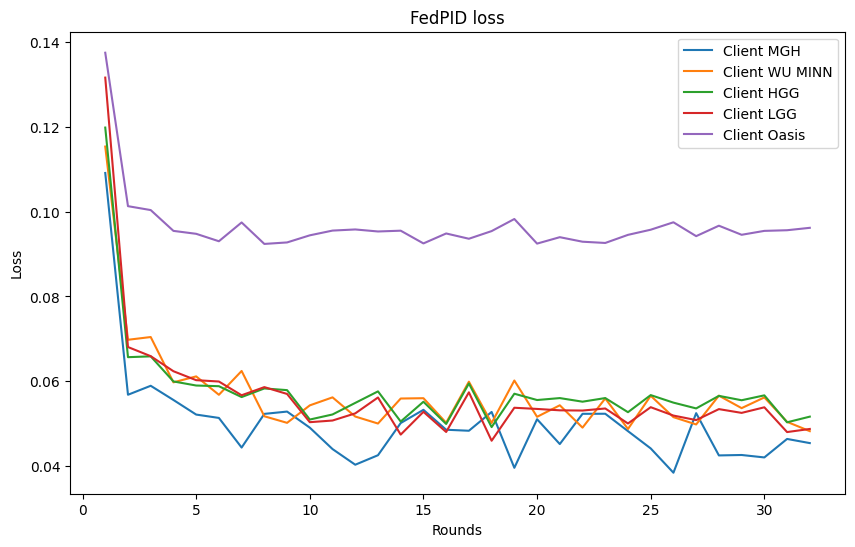

In [338]:
visualization.plot_learning_curves(loss_histories_fedpid, client_names, title="FedPID loss")

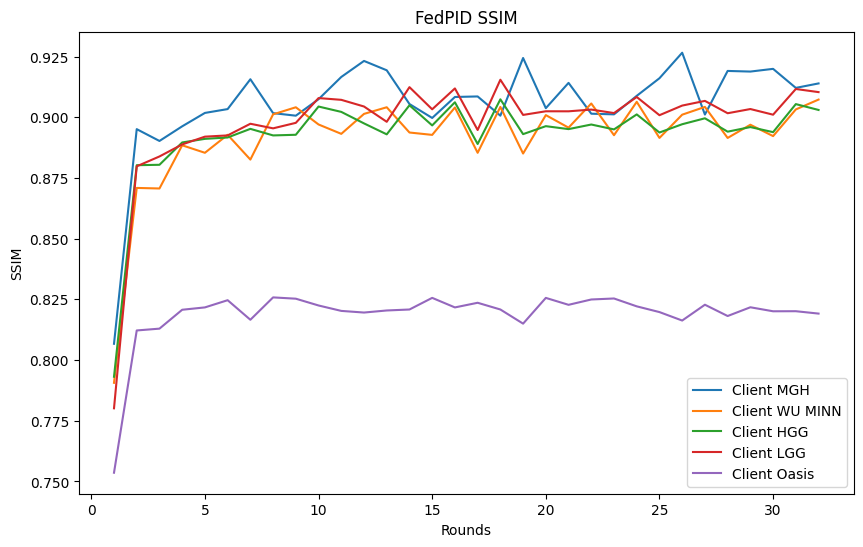

In [339]:
visualization.plot_learning_curves(ssim_histories_fedpid, client_names, title="FedPID SSIM", ylabel="SSIM")

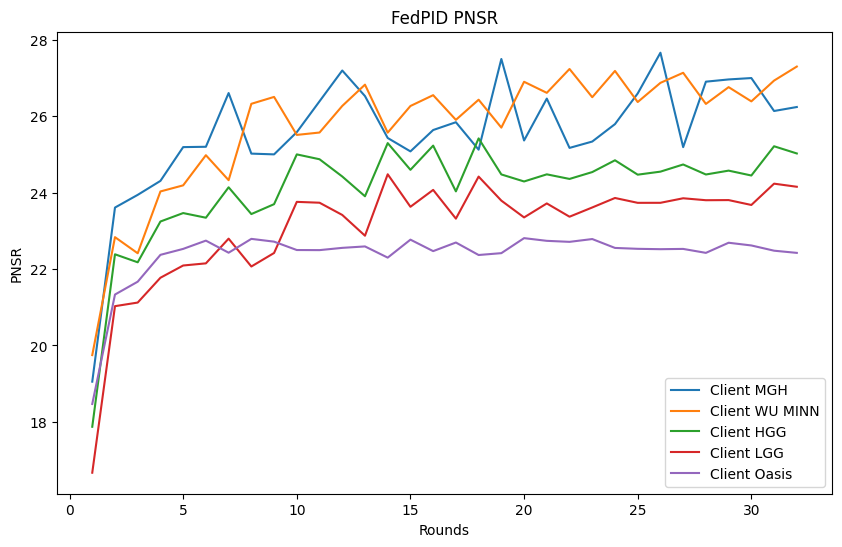

In [340]:
visualization.plot_learning_curves(pnsr_histories_fedpid, client_names, title="FedPID PNSR", ylabel="PNSR")

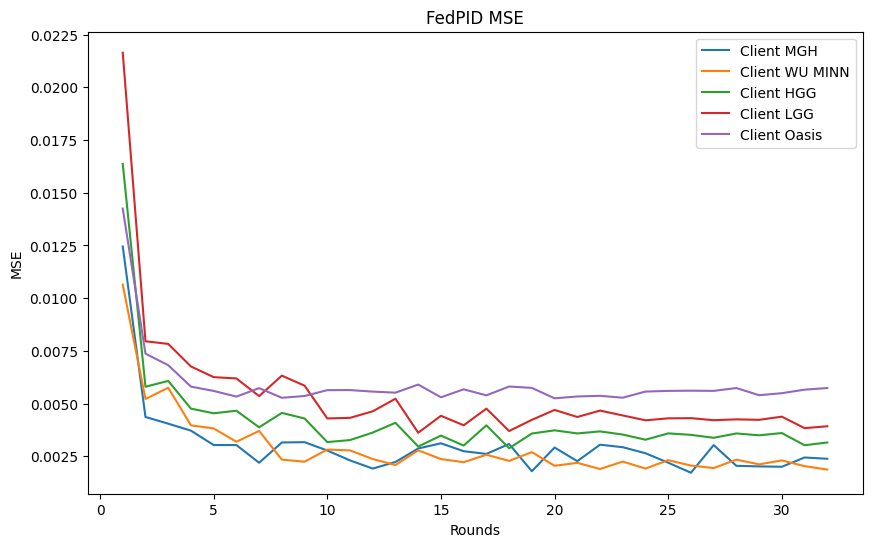

In [341]:
visualization.plot_learning_curves(mse_histories_fedpid, client_names, title="FedPID MSE", ylabel="MSE")

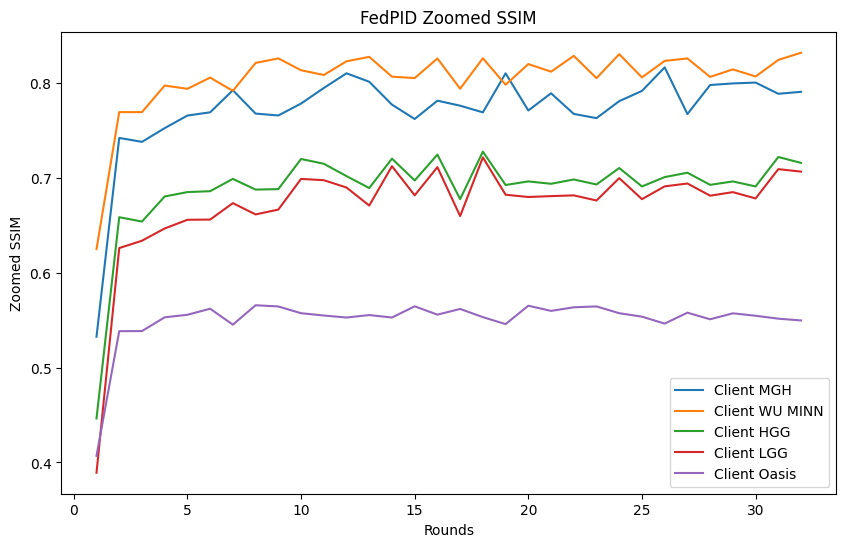

In [342]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedpid, client_names, title="FedPID Zoomed SSIM", ylabel="Zoomed SSIM")

In [343]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [344]:
predictions_fedpid = pred_on_different_ds(unet)

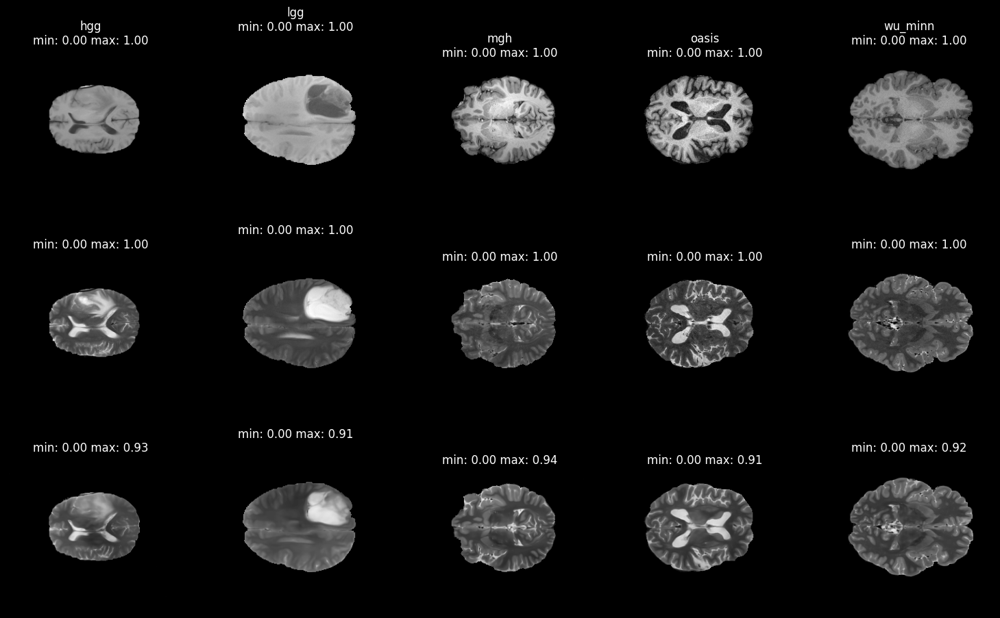

In [345]:
visualization.plot_pred([images, targets, predictions_fedpid], datasets_labels)

In [346]:
eval_metrics_fedpid = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedpid

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.045519,0.048275,0.051581,0.049055,0.096265
ssim,0.913732,0.907193,0.903131,0.909776,0.818954
zoomed_ssim,0.790220,0.831806,0.716058,0.706363,0.549671
pnsr,26.241435,27.292493,25.043899,24.219992,22.423126
mse,0.002385,0.001871,0.003147,0.003943,0.005742


## FedMean

In [347]:
model_dir = "../trained_models/server/model-fedmean-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-14h"

In [348]:
histories_fedmean = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedmean-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-14h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedmean-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-14h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedmean-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-14h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedmean-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-14h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedmean-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-18-14h\FedAvg_client_oasis_125/history.pkl...


In [349]:
histories_fedmean[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [350]:
loss_histories_fedmean = [history["loss"] for history in histories_fedmean]
ssim_histories_fedmean = [history["ssim"] for history in histories_fedmean]
pnsr_histories_fedmean = [history["pnsr"] for history in histories_fedmean]
mse_histories_fedmean = [history["mse"] for history in histories_fedmean]
zoomed_ssim_histories_fedmean = [history["zoomed_ssim"] for history in histories_fedmean]

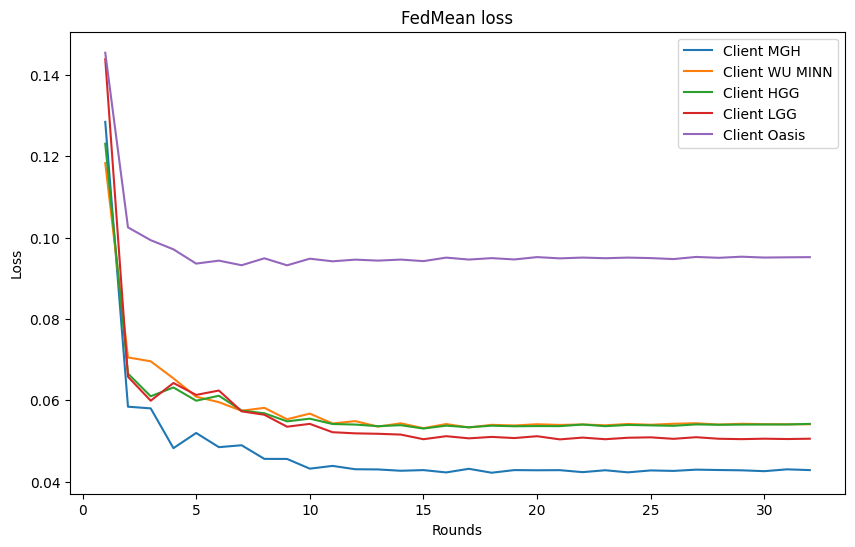

In [351]:
visualization.plot_learning_curves(loss_histories_fedmean, client_names, title="FedMean loss")

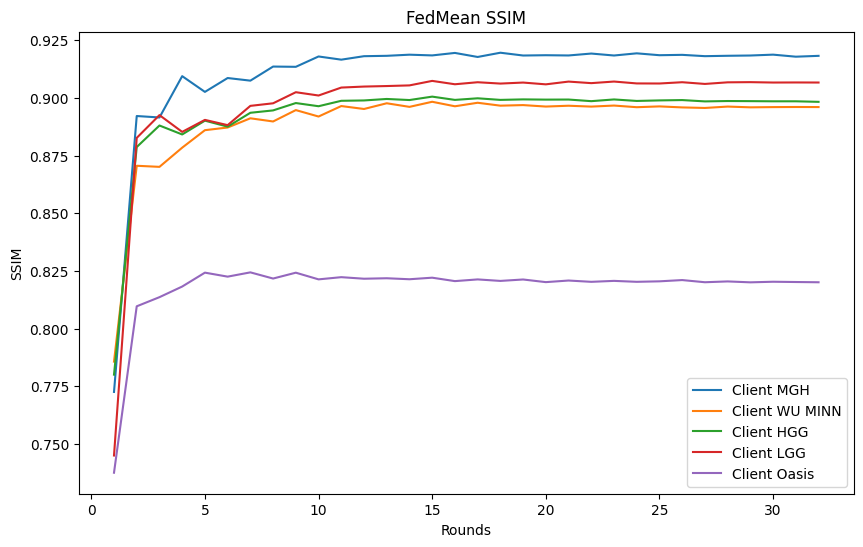

In [352]:
visualization.plot_learning_curves(ssim_histories_fedmean, client_names, title="FedMean SSIM", ylabel="SSIM")

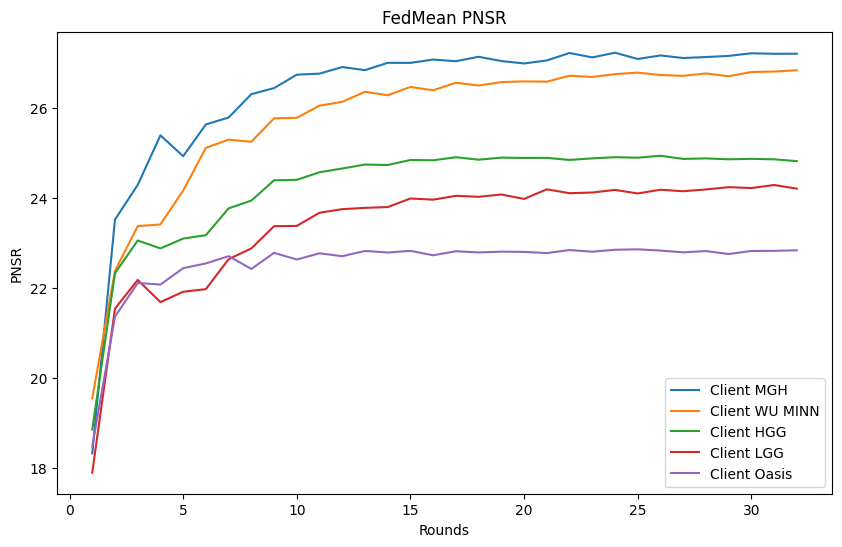

In [353]:
visualization.plot_learning_curves(pnsr_histories_fedmean, client_names, title="FedMean PNSR", ylabel="PNSR")

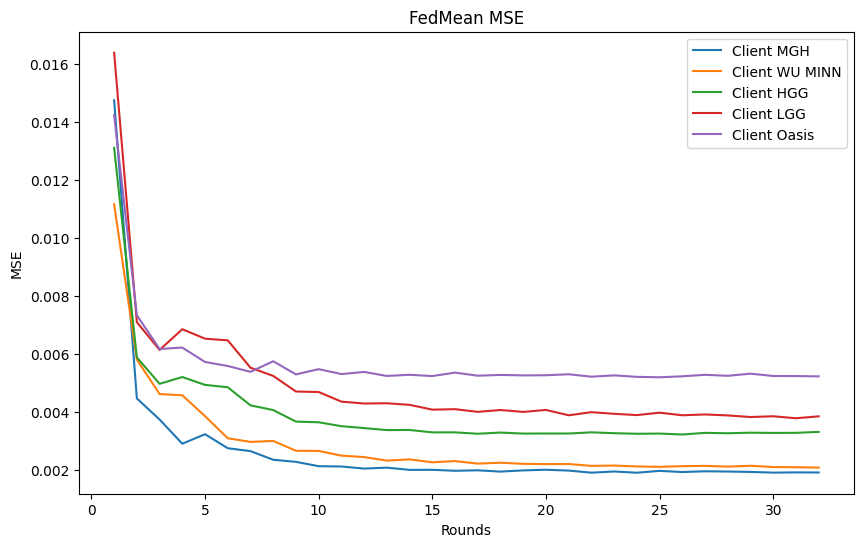

In [354]:
visualization.plot_learning_curves(mse_histories_fedmean, client_names, title="FedMean MSE", ylabel="MSE")

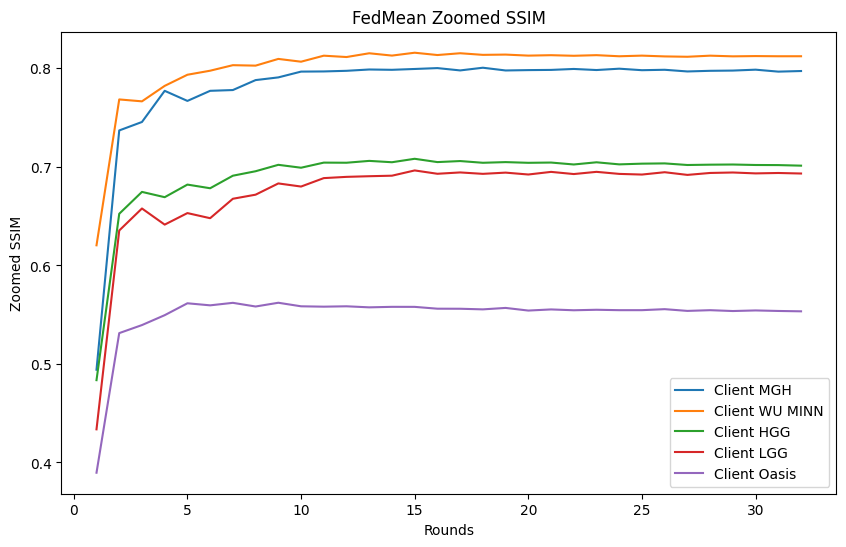

In [355]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedmean, client_names, title="FedMean Zoomed SSIM", ylabel="Zoomed SSIM")

In [356]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [357]:
predictions_fedmean = pred_on_different_ds(unet)

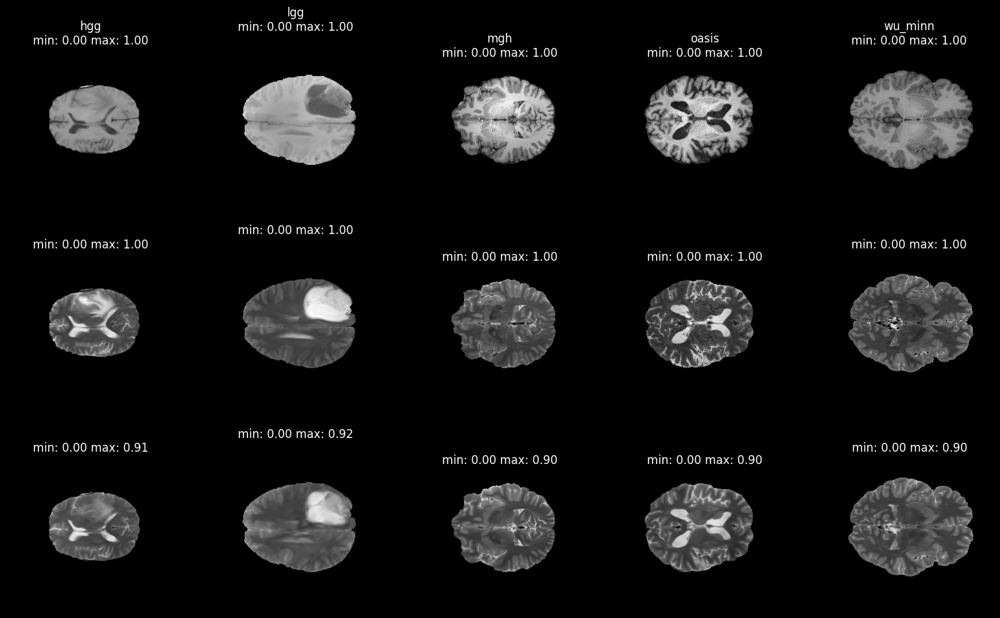

In [358]:
visualization.plot_pred([images, targets, predictions_fedmean], datasets_labels)

In [359]:
eval_metrics_fedmean = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedmean

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.042689,0.054022,0.054232,0.050536,0.095327
ssim,0.918424,0.896108,0.898125,0.906589,0.819816
zoomed_ssim,0.798016,0.812433,0.700968,0.693216,0.552591
pnsr,27.228876,26.842424,24.851036,24.280891,22.827991
mse,0.001902,0.002076,0.003294,0.003831,0.005235


## FedTrimmed

In [360]:
model_dir = "../trained_models/server/model-fedtrimmed-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h"

In [361]:
histories_fedtrimmed = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-fedtrimmed-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-fedtrimmed-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_hcp_wu_minn/history.pkl...
Opening history file ../trained_models/server/model-fedtrimmed-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_hgg_50/history.pkl...
Opening history file ../trained_models/server/model-fedtrimmed-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_lgg/history.pkl...
Opening history file ../trained_models/server/model-fedtrimmed-MSE_DSSIM-lr0.001-rd32-ep4-BN-2023-09-20-14h\FedAvg_client_oasis_125/history.pkl...


In [362]:
histories_fedtrimmed[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [363]:
loss_histories_fedtrimmed = [history["loss"] for history in histories_fedtrimmed]
ssim_histories_fedtrimmed = [history["ssim"] for history in histories_fedtrimmed]
pnsr_histories_fedtrimmed = [history["pnsr"] for history in histories_fedtrimmed]
mse_histories_fedtrimmed = [history["mse"] for history in histories_fedtrimmed]
zoomed_ssim_histories_fedtrimmed = [history["zoomed_ssim"] for history in histories_fedtrimmed]

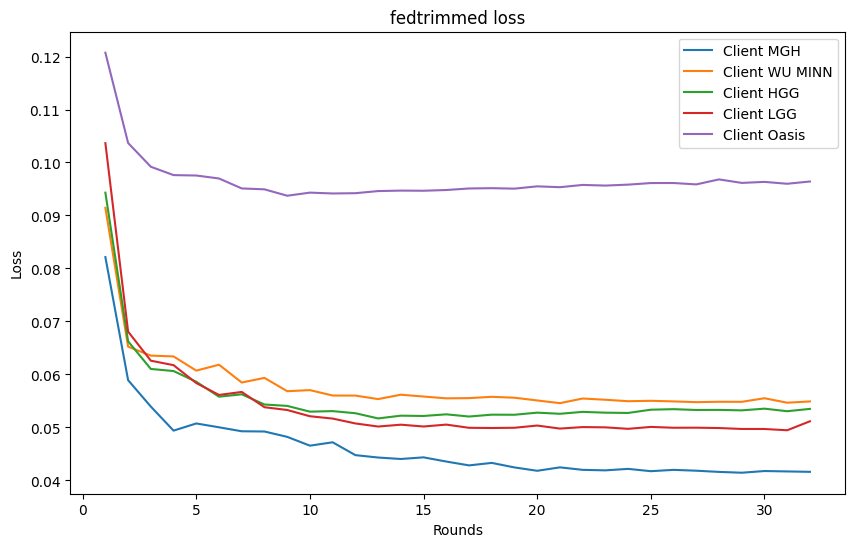

In [364]:
visualization.plot_learning_curves(loss_histories_fedtrimmed, client_names, title="fedtrimmed loss")

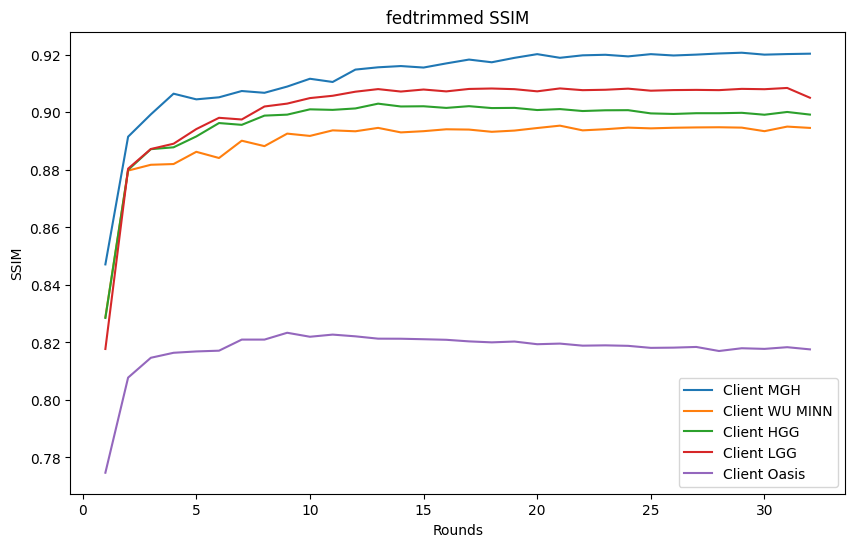

In [365]:
visualization.plot_learning_curves(ssim_histories_fedtrimmed, client_names, title="fedtrimmed SSIM", ylabel="SSIM")

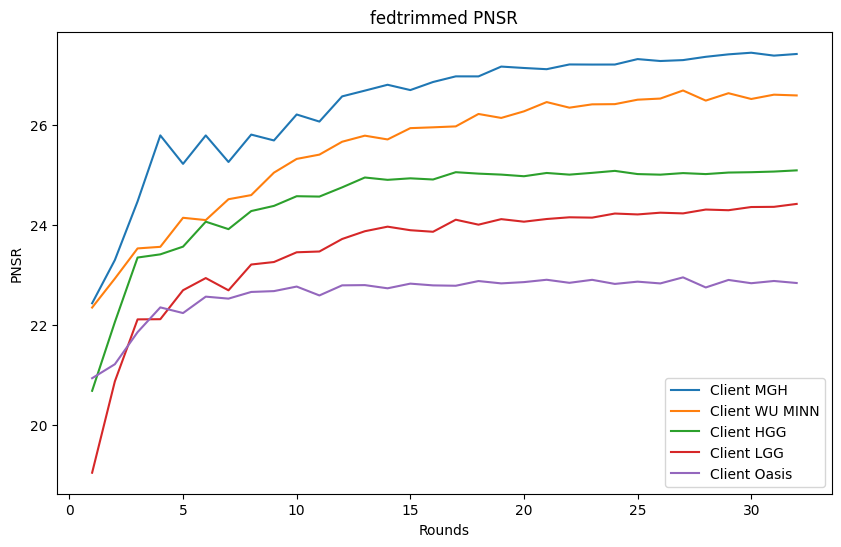

In [366]:
visualization.plot_learning_curves(pnsr_histories_fedtrimmed, client_names, title="fedtrimmed PNSR", ylabel="PNSR")

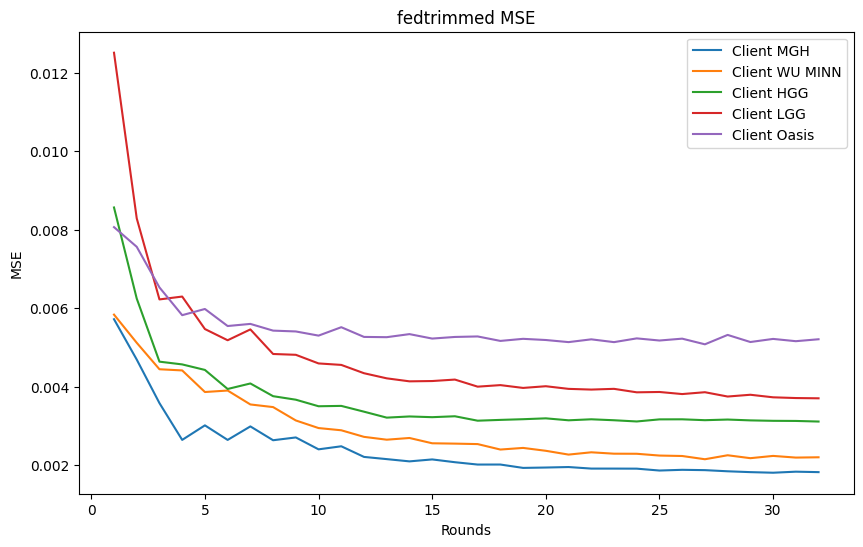

In [367]:
visualization.plot_learning_curves(mse_histories_fedtrimmed, client_names, title="fedtrimmed MSE", ylabel="MSE")

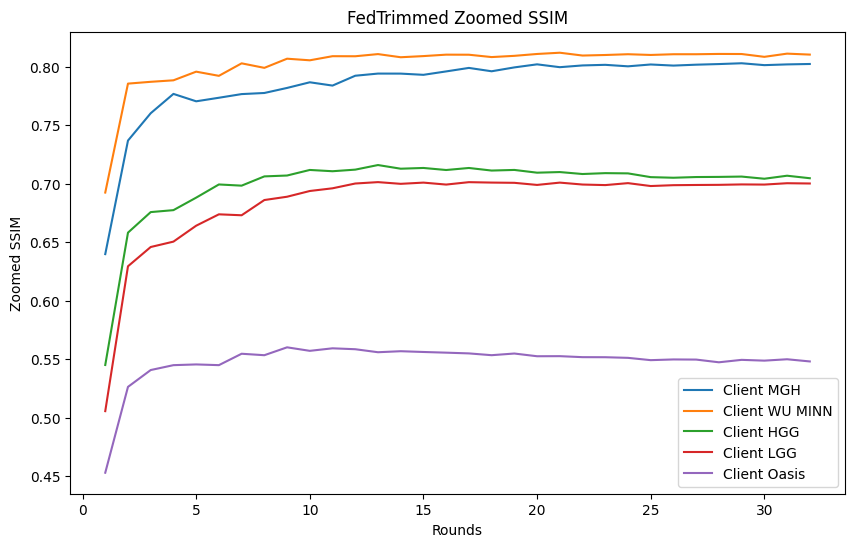

In [368]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedtrimmed, client_names, title="FedTrimmed Zoomed SSIM", ylabel="Zoomed SSIM")

In [369]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [370]:
predictions_fedtrimmed = pred_on_different_ds(unet)

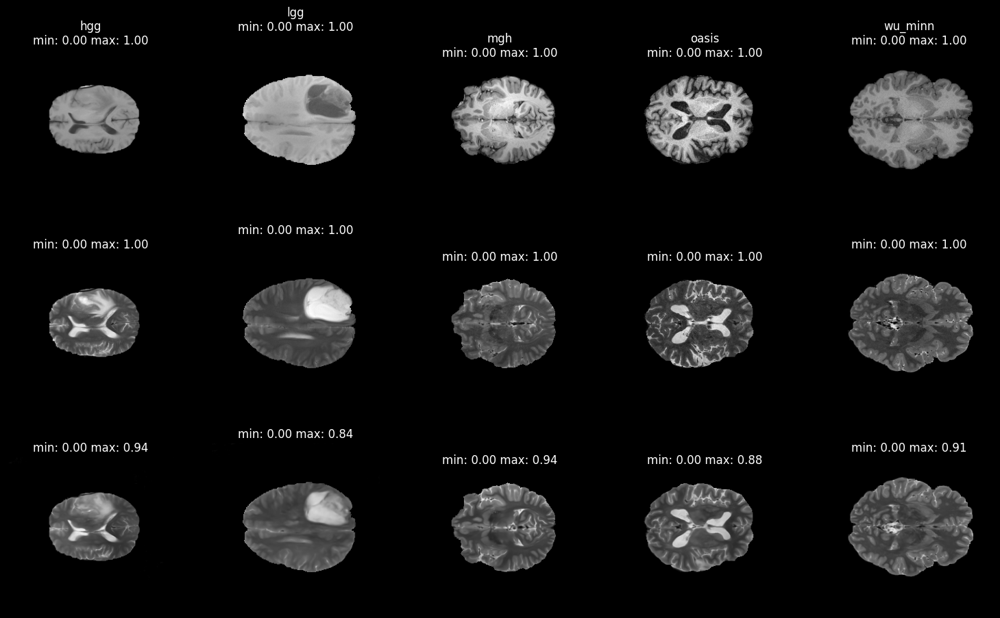

In [371]:
visualization.plot_pred([images, targets, predictions_fedtrimmed], datasets_labels)

In [372]:
eval_metrics_fedtrimmed = pd.DataFrame(get_evaluation_metrics(model_dir))
eval_metrics_fedtrimmed

,hcp_mgh_masks,hcp_wu_minn,hgg_50,lgg,oasis_125
loss,0.041713,0.055042,0.053483,0.052051,0.096335
ssim,0.920231,0.894338,0.899228,0.903335,0.817740
zoomed_ssim,0.801781,0.809846,0.705088,0.699406,0.548258
pnsr,27.397074,26.567841,25.111463,24.411081,22.848171
mse,0.001829,0.002210,0.003097,0.003718,0.005205


# Common plots

In [373]:
fed_labels = [
    "FedAvgM",
    "FedAvg",
    "FedAdam",
    "FedYogi",
    "FedAdagrad",
    "FedProx",
    "FedBN",
    "FedCostW",
    "FedPID",
    "FedMean",
    "FedTrimmed"
]

In [374]:
to_plot_ssim_zoomed = {
         "FedAvgM": zoomed_ssim_histories_fedavgm,
         "FedAvg":  zoomed_ssim_histories_fedavg,
         "FedAdam":  zoomed_ssim_histories_fedadam,
         "FedYogi":  zoomed_ssim_histories_fedyogi,
         "FedAdagrad":  zoomed_ssim_histories_fedadagrad,
         "FedProx":  zoomed_ssim_histories_fedprox,
         "FedBN":  zoomed_ssim_histories_fedbn,
         "FedCostW":  zoomed_ssim_histories_fedcost,
         "FedPID":  zoomed_ssim_histories_fedpid,
         "FedMean": zoomed_ssim_histories_fedmean,
        "FedTrimmed": zoomed_ssim_histories_fedtrimmed
}

to_plot_ssim = {
         "FedAvgM": ssim_histories_fedavgm,
         "FedAvg":  ssim_histories_fedavg,
         "FedAdam":  ssim_histories_fedadam,
         "FedYogi":  ssim_histories_fedyogi,
         "FedAdagrad":  ssim_histories_fedadagrad,
         "FedProx":  ssim_histories_fedprox,
         "FedBN":  ssim_histories_fedbn,
         "FedCostW":  ssim_histories_fedcost,
         "FedPID":  ssim_histories_fedpid,
         "FedMean": ssim_histories_fedmean,
    "FedTrimmed": ssim_histories_fedtrimmed
}

to_plot_loss = {
         "FedAvgM": loss_histories_fedavgm,
         "FedAvg":  loss_histories_fedavg,
         "FedAdam":  loss_histories_fedadam,
         "FedYogi":  loss_histories_fedyogi,
         "FedAdagrad":  loss_histories_fedadagrad,
         "FedProx":  loss_histories_fedprox,
         "FedBN":  loss_histories_fedbn,
         "FedCostW":  loss_histories_fedcost,
         "FedPID":  loss_histories_fedpid,
         "FedMean": loss_histories_fedmean,
    "FedTrimmed": loss_histories_fedtrimmed
}


In [375]:
all_predictions = [
                   predictions_fedavgm,
                   predictions_fedavg,
                   predictions_fedadam,
                   predictions_fedyogi,
                   predictions_fedadagrad,
                   predictions_fedprox,
                   predictions_fedbn,
                   predictions_fedcostw,
                   predictions_fedpid,
    predictions_fedtrimmed
                   ]

In [376]:
eval_metrics = [eval_metrics_fedavgm,
                eval_metrics_fedavg,
                eval_metrics_fedadam,
                eval_metrics_fedyogi,
                eval_metrics_fedadagrad,
                eval_metrics_fedprox,
                eval_metrics_fedbn,
                eval_metrics_fedcostw,
                eval_metrics_fedpid,
                eval_metrics_fedmean,
                eval_metrics_fedtrimmed
                ]

In [377]:
# fed_labels_no_fedbn = fed_labels.copy()
# fed_labels_no_fedbn.remove("FedBN")

metric_name = "zoomed_ssim"
specified_metric_eval = {}

for label, eval_metric in zip(fed_labels, eval_metrics):
    specified_metric_eval[label] = eval_metric.loc[metric_name]

pd.DataFrame(specified_metric_eval)

,FedAvgM,FedAvg,FedAdam,FedYogi,FedAdagrad,FedProx,FedBN,FedCostW,FedPID,FedMean,FedTrimmed
hcp_mgh_masks,0.774884,0.765092,0.766984,0.761770,0.696838,0.751634,0.795632,0.788518,0.790220,0.798016,0.801781
hcp_wu_minn,0.836519,0.816862,0.834484,0.817712,0.803267,0.798448,0.822031,0.818218,0.831806,0.812433,0.809846
hgg_50,0.707889,0.696062,0.714011,0.687973,0.660520,0.676431,0.694030,0.704065,0.716058,0.700968,0.705088
lgg,0.702680,0.690973,0.710550,0.670025,0.663089,0.639368,0.683697,0.694121,0.706363,0.693216,0.699406
oasis_125,0.561002,0.560601,0.574154,0.571731,0.530532,0.556250,0.562717,0.553671,0.549671,0.552591,0.548258


In [378]:
metric_name = "mse"
specified_metric_eval = {}

for label, eval_metric in zip(fed_labels, eval_metrics):
    specified_metric_eval[label] = eval_metric.loc[metric_name]

pd.DataFrame(specified_metric_eval)

,FedAvgM,FedAvg,FedAdam,FedYogi,FedAdagrad,FedProx,FedBN,FedCostW,FedPID,FedMean,FedTrimmed
hcp_mgh_masks,0.002572,0.002892,0.002809,0.003131,0.004249,0.003365,0.002061,0.002209,0.002385,0.001902,0.001829
hcp_wu_minn,0.001673,0.002056,0.001800,0.002374,0.002416,0.003152,0.001953,0.002100,0.001871,0.002076,0.002210
hgg_50,0.003259,0.003301,0.003417,0.004133,0.004124,0.004895,0.003479,0.003416,0.003147,0.003294,0.003097
lgg,0.003789,0.003914,0.003534,0.004932,0.004258,0.006848,0.004117,0.003821,0.003943,0.003831,0.003718
oasis_125,0.005065,0.005266,0.004846,0.005270,0.005774,0.005365,0.005190,0.005396,0.005742,0.005235,0.005205


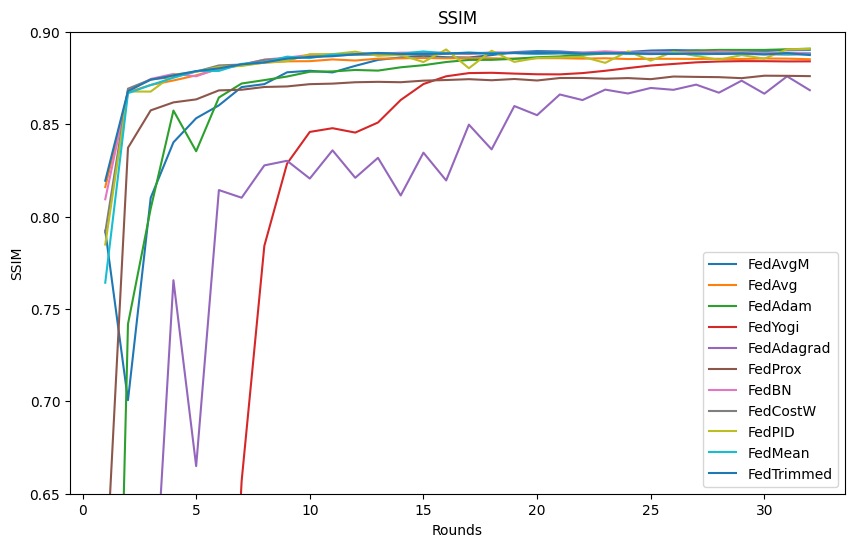

In [379]:
average_curves_ssim = [get_average_curve(history) for history in to_plot_ssim.values()]
visualization.plot_learning_curves(average_curves_ssim, list(to_plot_ssim.keys()), title="SSIM", ylabel="SSIM", ylim=(0.65, 0.9))

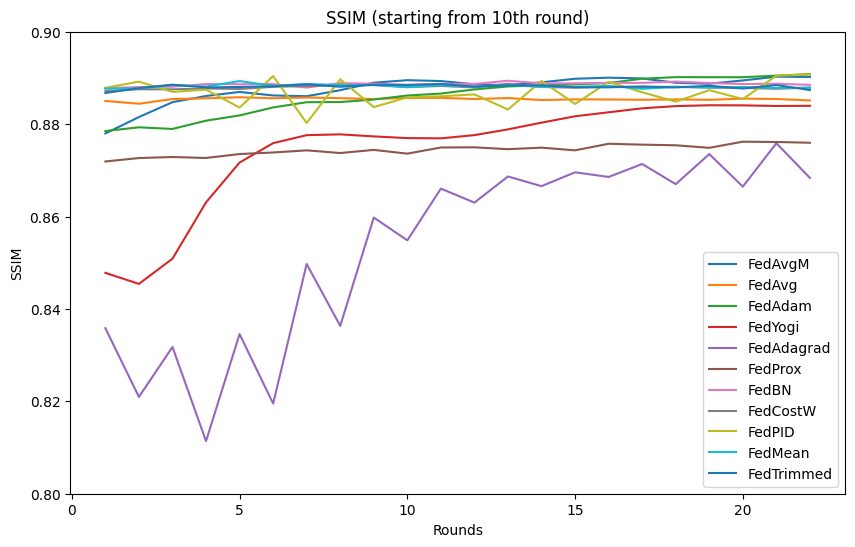

In [380]:
start_round = 10
visualization.plot_learning_curves(np.array(average_curves_ssim)[:, start_round:], fed_labels, title=f"SSIM (starting from {start_round}th round)", ylabel="SSIM", ylim=(0.8, 0.9))

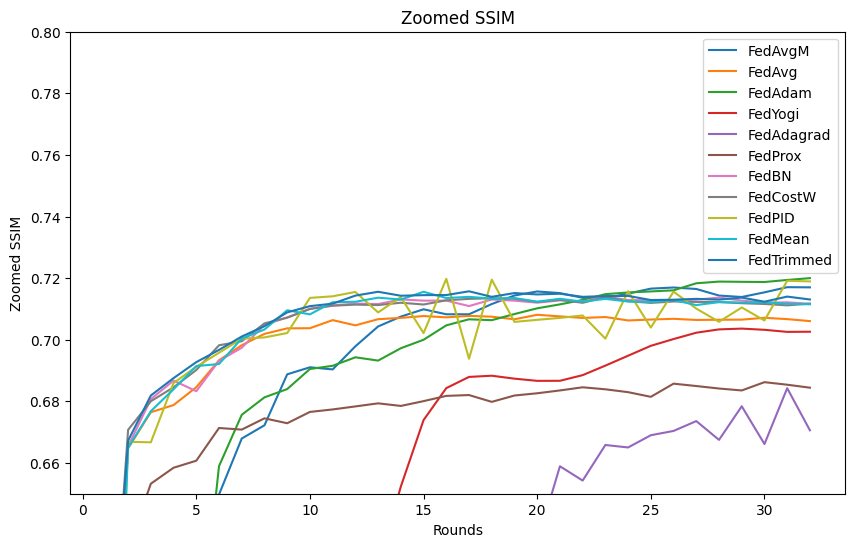

In [381]:
average_curves = [get_average_curve(history) for history in to_plot_ssim_zoomed.values()]
visualization.plot_learning_curves(average_curves, list(to_plot_ssim.keys()), title="Zoomed SSIM", ylabel="Zoomed SSIM", ylim=(0.65, 0.8))

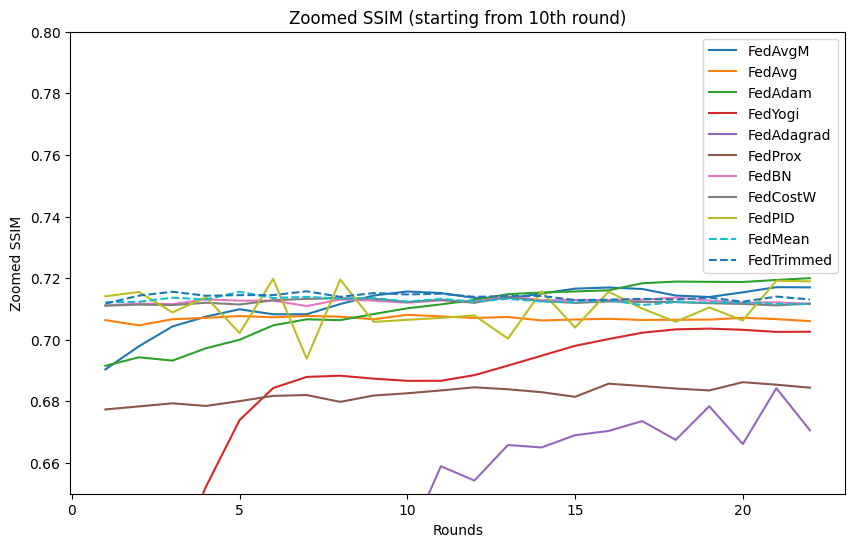

In [382]:
start_round = 10
linestyle = ["-"] *9 + ["--"] * 2
visualization.plot_learning_curves(np.array(average_curves)[:, start_round:], fed_labels, title=f"Zoomed SSIM (starting from {start_round}th round)", ylabel="Zoomed SSIM", ylim=(0.65, 0.8), linetypes=linestyle)

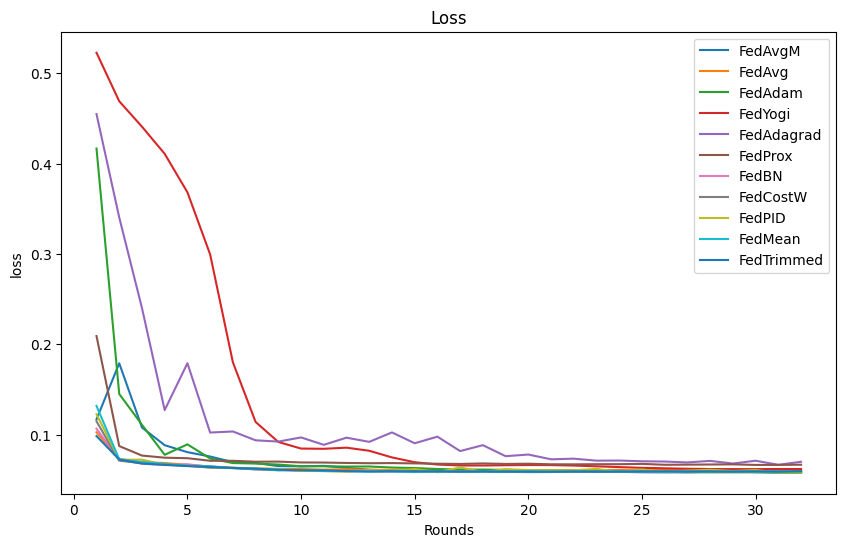

In [383]:
average_curves_loss = [get_average_curve(history) for history in to_plot_loss.values()]
visualization.plot_learning_curves(average_curves_loss, list(to_plot_ssim.keys()), title="Loss", ylabel="loss")

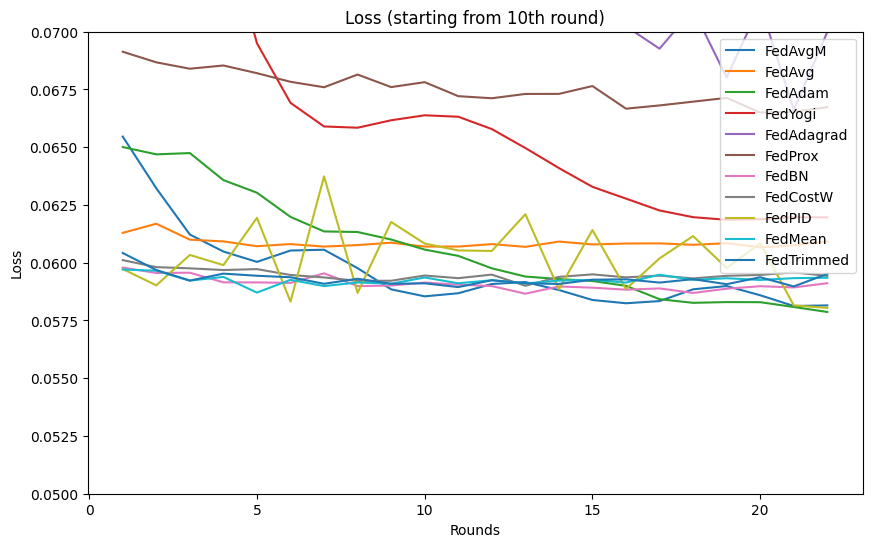

In [384]:
visualization.plot_learning_curves(np.array(average_curves_loss)[:, start_round:], fed_labels, title=f"Loss (starting from {start_round}th round)", ylabel="Loss", ylim=(0.05, 0.07))

## Selected brain slices plot

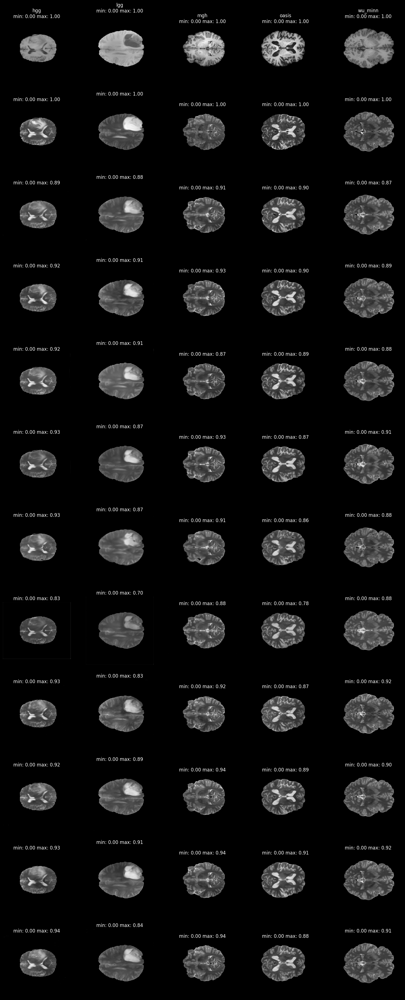

In [385]:
visualization.plot_pred([images, targets] + all_predictions, datasets_labels, show=True)

# Zoomed SSIM

## FedAvg

In [386]:
model_dir = "../trained_models/server/model-FED_AVG-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-08-13h"

In [387]:
histories_fedavg_zoomed = get_server_histories(model_dir)

Opening history file ../trained_models/server/model-FED_AVG-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-08-13h\FedAvg_client_hcp_mgh_masks/history.pkl...
Opening history file ../trained_models/server/model-FED_AVG-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-08-13h\FedAvg_client_hgg_26/history.pkl...
Opening history file ../trained_models/server/model-FED_AVG-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-08-13h\FedAvg_client_lgg_26/history.pkl...
Opening history file ../trained_models/server/model-FED_AVG-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-08-13h\FedAvg_client_oasis_26/history.pkl...
Opening history file ../trained_models/server/model-FED_AVG-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-08-13h\FedAvg_client_wu_minn_26/history.pkl...


In [388]:
histories_fedavg_zoomed[0].keys()

dict_keys(['loss', 'ssim', 'zoomed_ssim', 'pnsr', 'mse'])

In [389]:
loss_histories_fedavg_zoomed = [history["loss"] for history in histories_fedavg_zoomed]
ssim_histories_fedavg_zoomed = [history["ssim"] for history in histories_fedavg_zoomed]
pnsr_histories_fedavg_zoomed = [history["pnsr"] for history in histories_fedavg_zoomed]
mse_histories_fedavg_zoomed = [history["mse"] for history in histories_fedavg_zoomed]
zoomed_ssim_histories_fedavg_zoomed = [history["zoomed_ssim"] for history in histories_fedavg_zoomed]

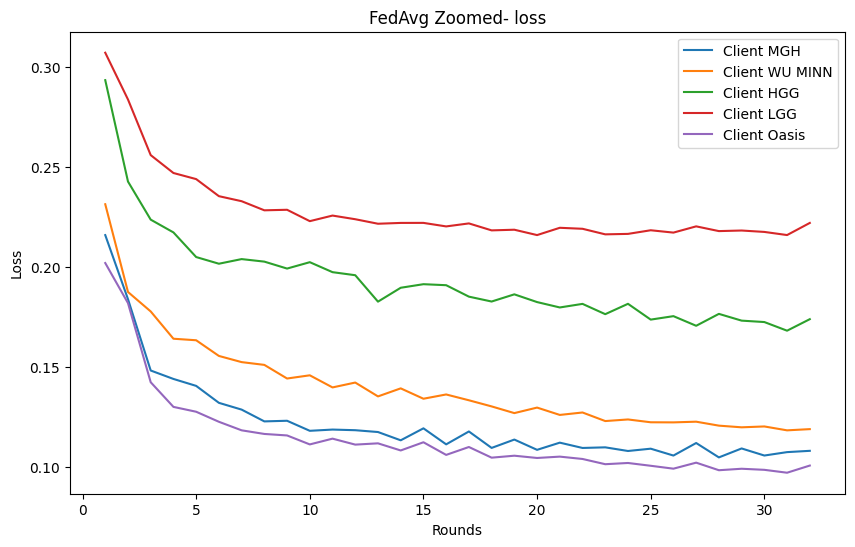

In [390]:
visualization.plot_learning_curves(loss_histories_fedavg_zoomed, client_names, title="FedAvg Zoomed- loss")

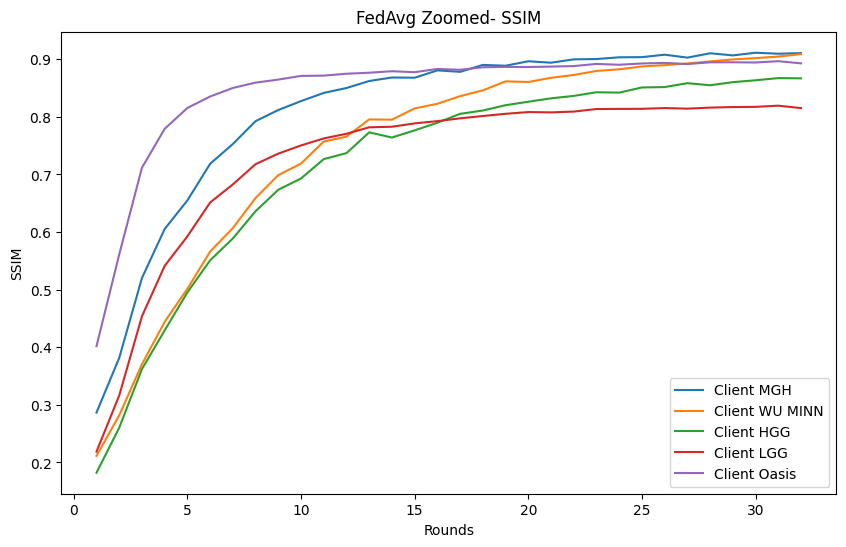

In [391]:
visualization.plot_learning_curves(ssim_histories_fedavg_zoomed, client_names, title="FedAvg Zoomed- SSIM", ylabel="SSIM")

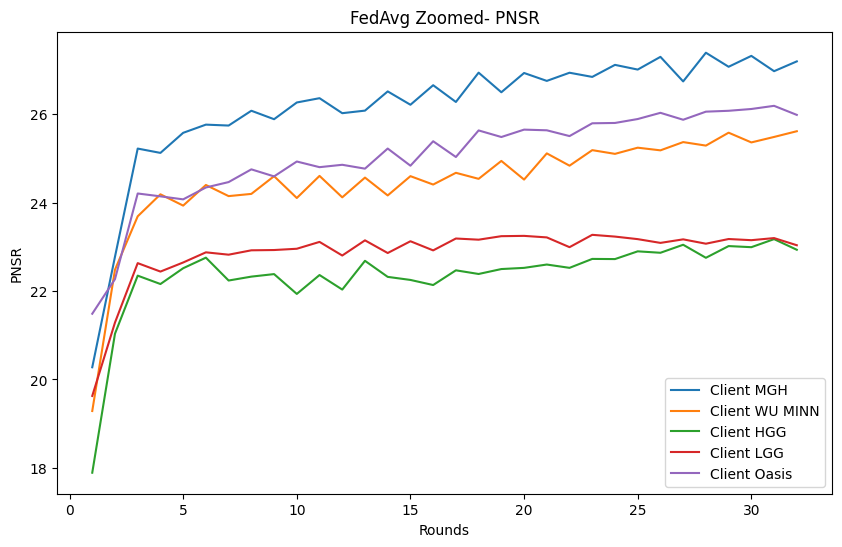

In [392]:
visualization.plot_learning_curves(pnsr_histories_fedavg_zoomed, client_names, title="FedAvg Zoomed- PNSR", ylabel="PNSR")

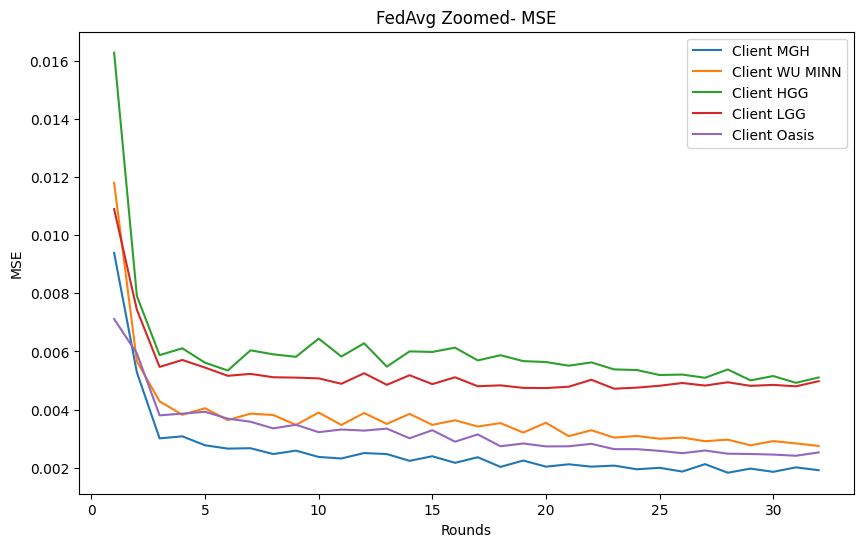

In [393]:
visualization.plot_learning_curves(mse_histories_fedavg_zoomed, client_names, title="FedAvg Zoomed- MSE", ylabel="MSE")

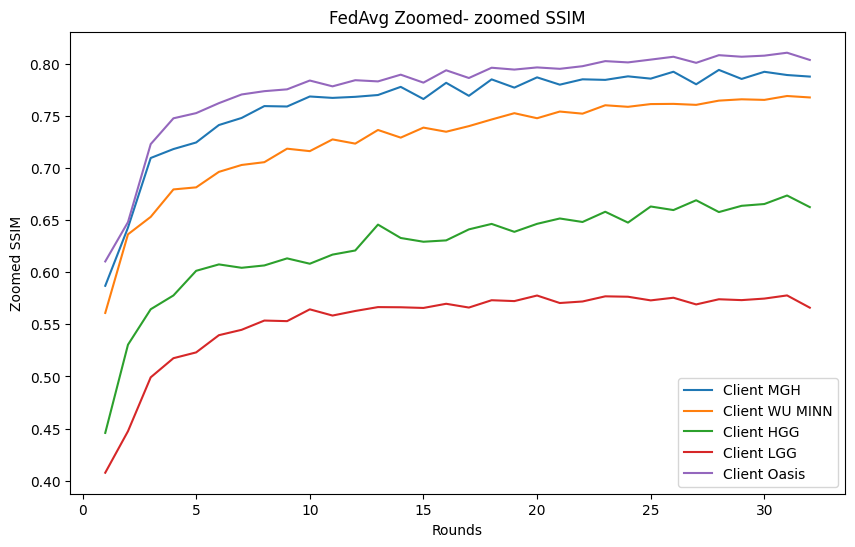

In [394]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedavg_zoomed, client_names, title="FedAvg Zoomed- zoomed SSIM", ylabel="Zoomed SSIM")

In [395]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [396]:
predictions_fedavg_zoomed= unet(images)

TypeError: conv2d() received an invalid combination of arguments - got (list, Parameter, NoneType, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!list of [Tensor, Tensor, Tensor, Tensor, Tensor]!, !Parameter!, !NoneType!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!list of [Tensor, Tensor, Tensor, Tensor, Tensor]!, !Parameter!, !NoneType!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)


In [ ]:
visualization.plot_batch([images, target, predictions_fedavg.detach(), predictions_fedavg_zoomed.detach()], plot_labels + ["predicted zoomed ssim"])

## FedCostW

In [ ]:
model_dir = "../trained_models/server/model-FED_COSTW-MSE_ZOOMED_DSSIM-lr0.001-rd32-ep4-BN-2023-09-12-10h"

In [ ]:
histories_fedcost = get_server_histories(model_dir)

In [ ]:
histories_fedcost[0].keys()

In [ ]:
loss_histories_fedcost = [history["loss"] for history in histories_fedcost]
ssim_histories_fedcost = [history["ssim"] for history in histories_fedcost]
pnsr_histories_fedcost = [history["pnsr"] for history in histories_fedcost]
mse_histories_fedcost = [history["mse"] for history in histories_fedcost]
zoomed_ssim_histories_fedcost = [history["zoomed_ssim"] for history in histories_fedcost]

In [ ]:
visualization.plot_learning_curves(loss_histories_fedcost, client_names, title="FedCostW loss")

In [ ]:
visualization.plot_learning_curves(ssim_histories_fedcost, client_names, title="FedCostW SSIM", ylabel="SSIM")

In [ ]:
visualization.plot_learning_curves(pnsr_histories_fedcost, client_names, title="FedAvgM PNSR", ylabel="PNSR")

In [ ]:
visualization.plot_learning_curves(mse_histories_fedcost, client_names, title="FedAvgM MSE", ylabel="MSE")

In [ ]:
visualization.plot_learning_curves(zoomed_ssim_histories_fedcost, client_names, title="FedAvgM Zoomed SSIM", ylabel="Zoomed SSIM")

In [ ]:
unet = models.UNet(normalization=config_train.NormalizationType.BN)
unet.load_state_dict(torch.load(f"{model_dir}/round32.pth", map_location=torch.device('cpu')))

In [ ]:
predictions_fedcostw_zooomed = unet(images)

In [ ]:
visualization.plot_batch([images, target, predictions_fedcostw.detach(), predictions_fedcostw_zooomed.detach()], plot_labels + ["Predicted zoomed"])

# Numpy files reshape by adding padding

In [ ]:
t1_fixed = os.path.join(fixed_path, "t2")
# t2_fixed = os.path.join(fixed_path, "t2")

In [ ]:
file_name = "patient0-slice75.npy"

In [ ]:
with open(os.path.join(t1_fixed, file_name), 'rb') as f:
    img = np.load(f)

In [ ]:
pad_x = np.zeros((10, 240))
pad_y_1 = np.zeros((260, 35))
pad_y_2 = np.zeros((260, 36))

In [ ]:
pad_x.shape

In [ ]:
img = np.concatenate((pad_x, img, pad_x), axis=0)
img = np.concatenate((pad_y_1, img, pad_y_2), axis=1)

img.shape

In [ ]:
plt.imshow(img)

In [ ]:
with open(file_name, "wb") as file:
    np.save(os.path.join(t1_fixed, file_name), img)